In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import torchvision.utils as vutils
from sklearn.metrics import roc_curve, auc
import random
import numpy as np
import warnings
from torch.utils.data import Subset
from collections import Counter
from torch.optim.lr_scheduler import ReduceLROnPlateau
import pandas as pd
from torch.nn.functional import mse_loss
import pickle
import numpy as np
import seaborn as sns
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Chargement et préparation des ensembles de données : MVTec AD et AutoVI

In [2]:
from Load_dataset import (
    load_autoVI, load_bottle, load_capsule, load_hazelnut, load_toothbrush
)

In [3]:
def plot_samples(dataset, title, n_samples=8):
    indices = torch.randint(0, len(dataset), (n_samples,))
    samples = [dataset[i] for i in indices]
    images, labels = zip(*samples)
    
    fig, axes = plt.subplots(1, n_samples, figsize=(15, 5))
    fig.suptitle(title, fontsize=16)
    
    for i, (img, label) in enumerate(zip(images, labels)):
        img = img.permute(1, 2, 0).numpy()
        #img = (img * 0.5) + 0.5  # Inverser la normalisation
        
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(dataset.classes[label], fontsize=10)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

## 1-1 AutoVI

In [4]:
AutoVI_train_dataset, AutoVI_test_dataset, AutoVI_train_loader, AutoVI_test_loader, filtered_AutoVI_test_dataset, filtered_AutoVI_test_loader, anomaly_AutoVI_test_dataset, anomaly_AutoVI_test_loader = load_autoVI()

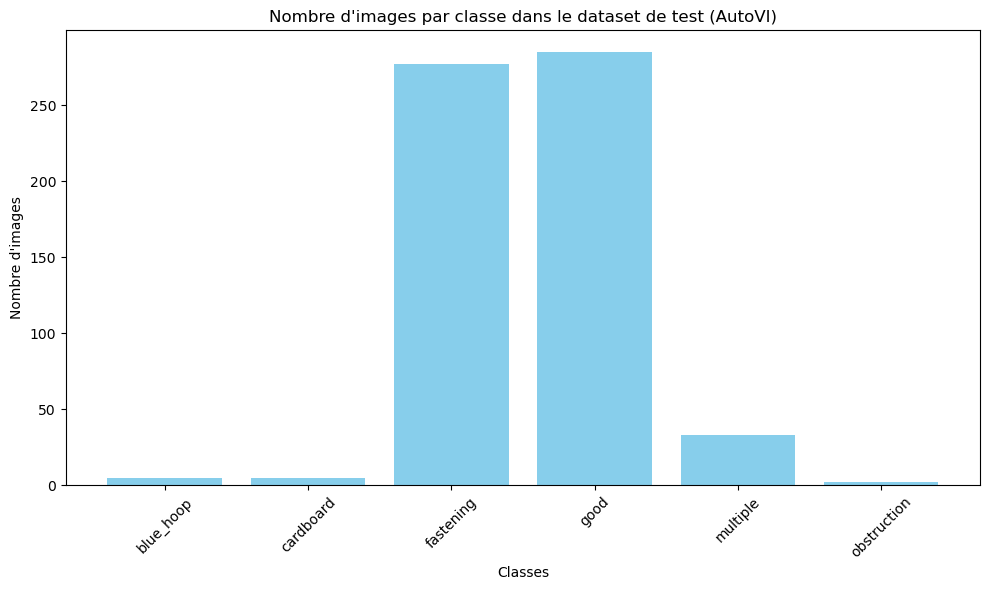

In [5]:
class_counts = Counter([label for _, label in AutoVI_test_dataset])
class_names = AutoVI_test_dataset.classes
class_image_counts = {class_names[class_id]: count for class_id, count in class_counts.items()}

plt.figure(figsize=(10, 6))
plt.bar(class_image_counts.keys(), class_image_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par classe dans le dataset de test (AutoVI)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

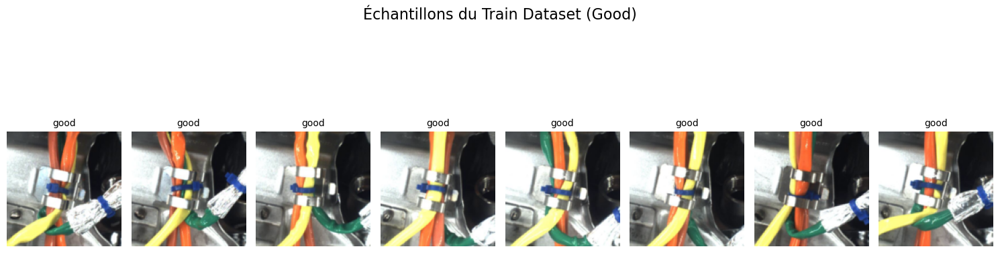

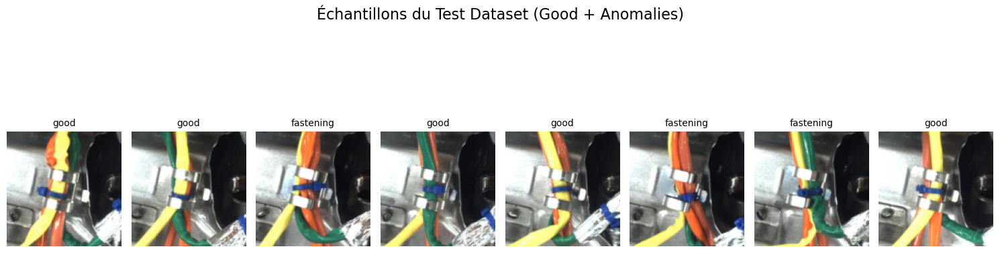

In [6]:
plot_samples(AutoVI_train_dataset, "Échantillons du Train Dataset (Good)", n_samples=8)
plot_samples(AutoVI_test_dataset, "Échantillons du Test Dataset (Good + Anomalies)", n_samples=8)

## 1-2 Bottle

In [7]:
bottle_train_dataset, bottle_test_dataset, bottle_train_loader, bottle_test_loader, filtered_bottle_test_dataset, filtered_bottle_test_loader,anomaly_bottle_test_dataset, anomaly_bottle_test_loader = load_bottle()

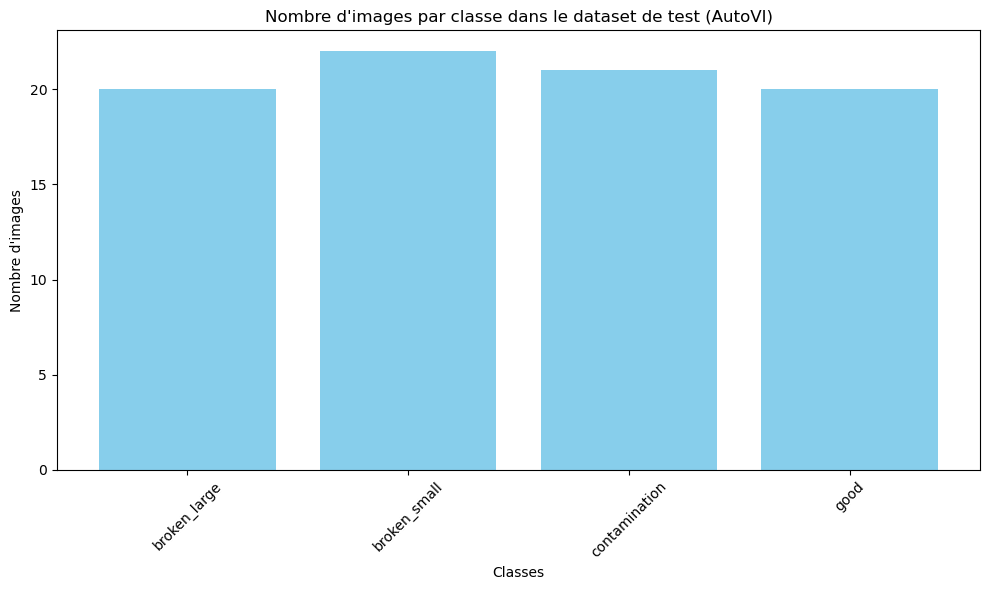

In [8]:
class_counts = Counter([label for _, label in bottle_test_dataset])
class_names = bottle_test_dataset.classes
class_image_counts = {class_names[class_id]: count for class_id, count in class_counts.items()}

plt.figure(figsize=(10, 6))
plt.bar(class_image_counts.keys(), class_image_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par classe dans le dataset de test (AutoVI)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

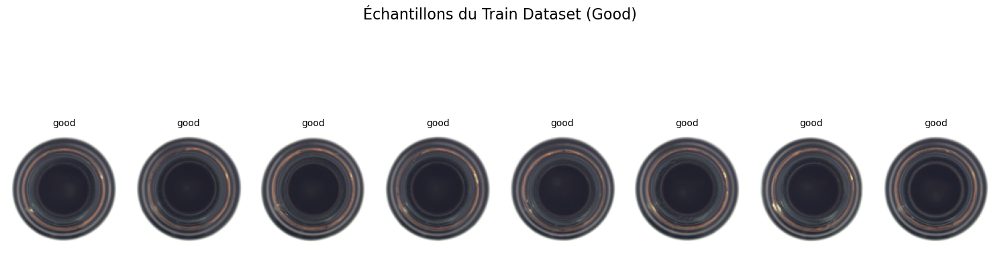

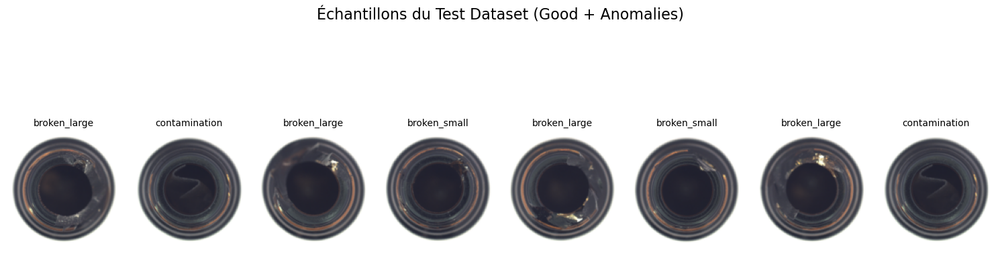

In [9]:
plot_samples(bottle_train_dataset, "Échantillons du Train Dataset (Good)", n_samples=8)
plot_samples(bottle_test_dataset, "Échantillons du Test Dataset (Good + Anomalies)", n_samples=8)

## 1-3 Capsule

In [10]:
capsule_train_dataset, capsule_test_dataset, capsule_train_loader, capsule_test_loader, filtered_capsule_test_dataset, filtered_capsule_test_loader, anomaly_capsule_test_dataset, anomaly_capsule_test_loader = load_capsule()

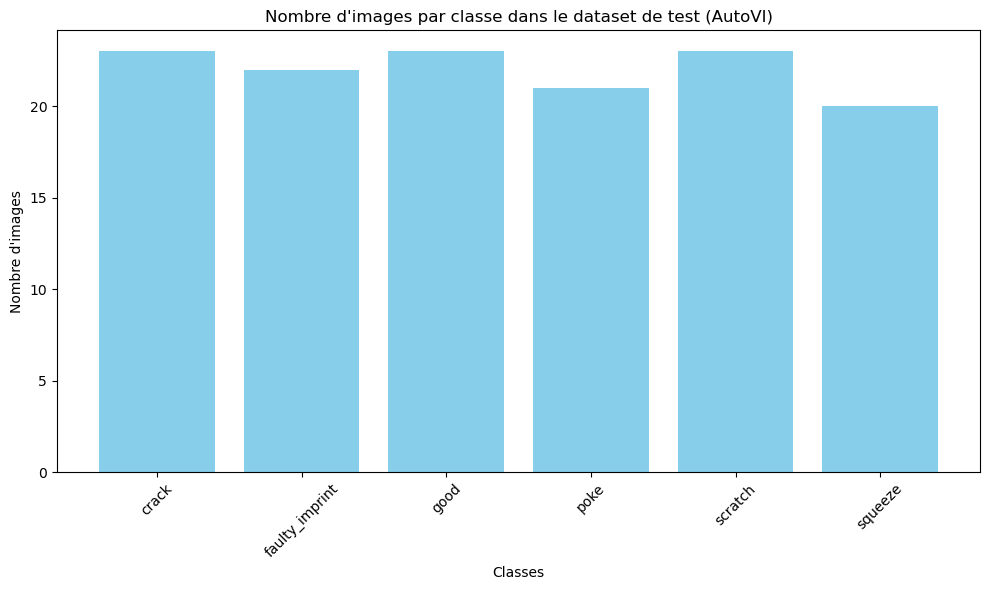

In [11]:
class_counts = Counter([label for _, label in capsule_test_dataset])
class_names = capsule_test_dataset.classes
class_image_counts = {class_names[class_id]: count for class_id, count in class_counts.items()}

plt.figure(figsize=(10, 6))
plt.bar(class_image_counts.keys(), class_image_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par classe dans le dataset de test (AutoVI)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

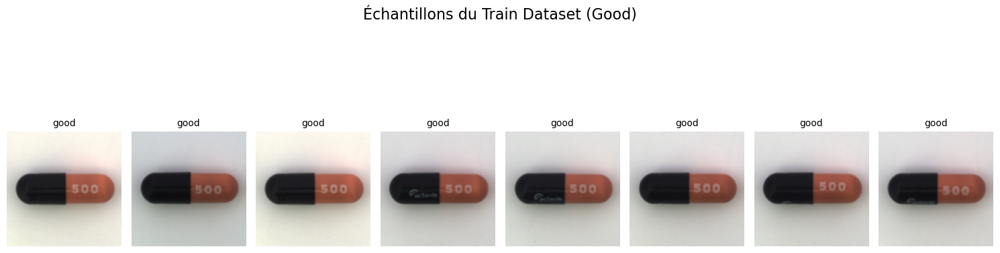

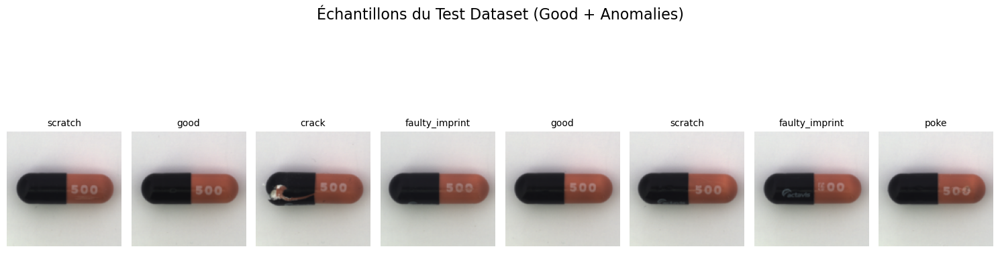

In [12]:
plot_samples(capsule_train_dataset, "Échantillons du Train Dataset (Good)", n_samples=8)
plot_samples(capsule_test_dataset, "Échantillons du Test Dataset (Good + Anomalies)", n_samples=8)

## 1-4 Hazelnut

In [13]:
hazelnut_train_dataset, hazelnut_test_dataset, hazelnut_train_loader, hazelnut_test_loader, filtered_hazelnut_test_dataset, filtered_hazelnut_test_loader, anomaly_hazelnut_test_dataset, anomaly_hazelnut_test_loader = load_hazelnut()

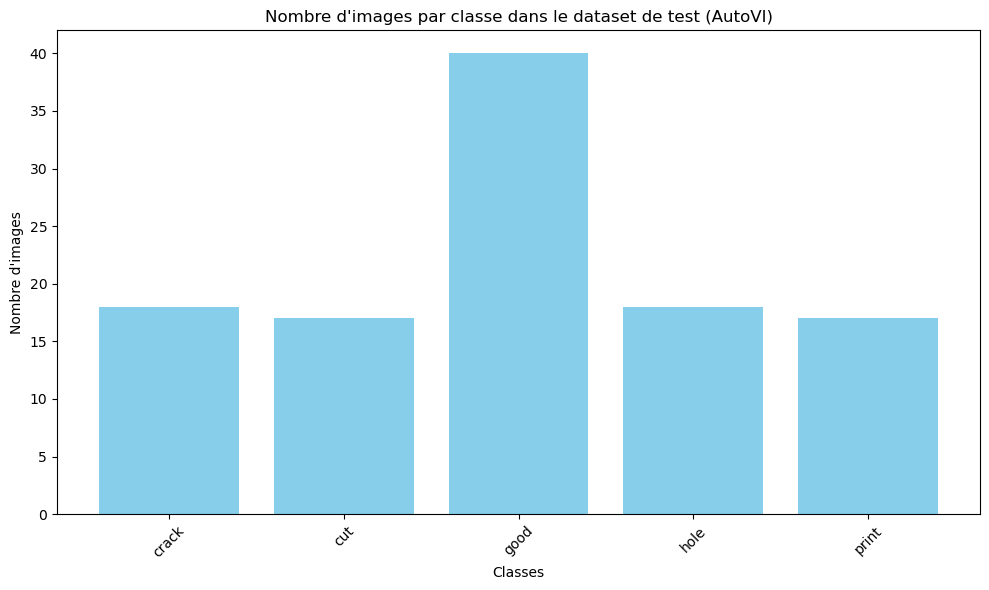

In [14]:
class_counts = Counter([label for _, label in hazelnut_test_dataset])
class_names = hazelnut_test_dataset.classes
class_image_counts = {class_names[class_id]: count for class_id, count in class_counts.items()}

plt.figure(figsize=(10, 6))
plt.bar(class_image_counts.keys(), class_image_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par classe dans le dataset de test (AutoVI)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

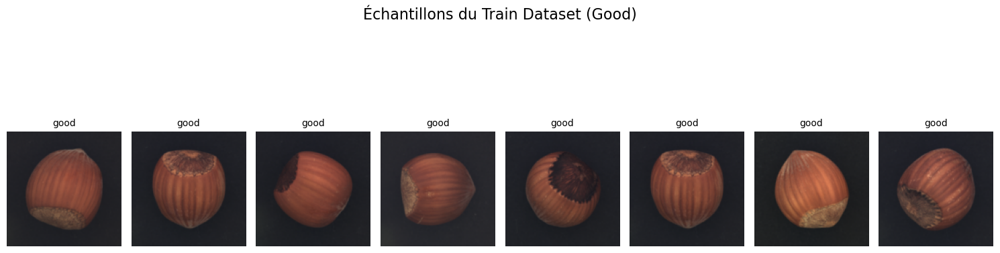

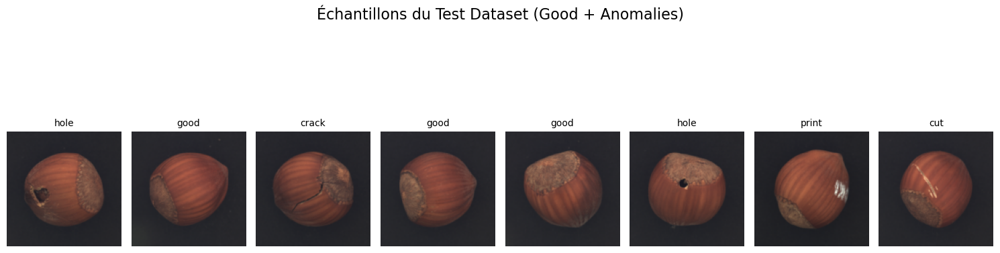

In [15]:
plot_samples(hazelnut_train_dataset, "Échantillons du Train Dataset (Good)", n_samples=8)
plot_samples(hazelnut_test_dataset, "Échantillons du Test Dataset (Good + Anomalies)", n_samples=8)

## 1-5 Toothbrush

In [16]:
toothbrush_train_dataset, toothbrush_test_dataset, toothbrush_train_loader, toothbrush_test_loader, filtered_toothbrush_test_dataset, filtered_toothbrush_test_loader, anomaly_toothbrush_test_dataset, anomaly_toothbrush_test_loader = load_toothbrush()

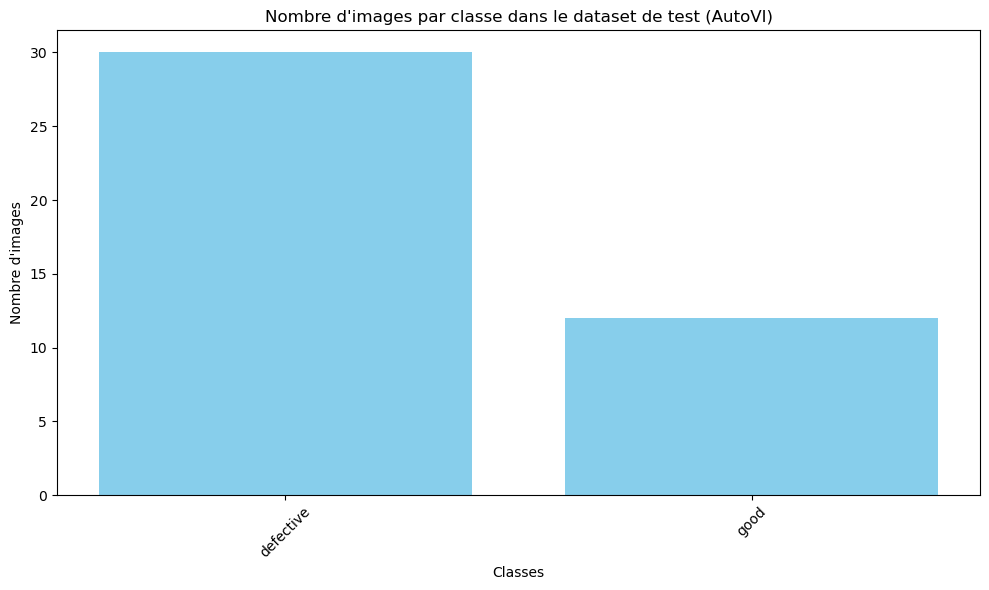

In [17]:
class_counts = Counter([label for _, label in toothbrush_test_dataset])
class_names = toothbrush_test_dataset.classes
class_image_counts = {class_names[class_id]: count for class_id, count in class_counts.items()}

plt.figure(figsize=(10, 6))
plt.bar(class_image_counts.keys(), class_image_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par classe dans le dataset de test (AutoVI)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

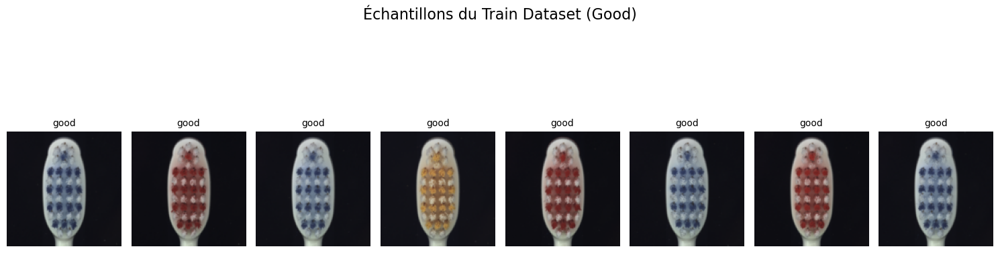

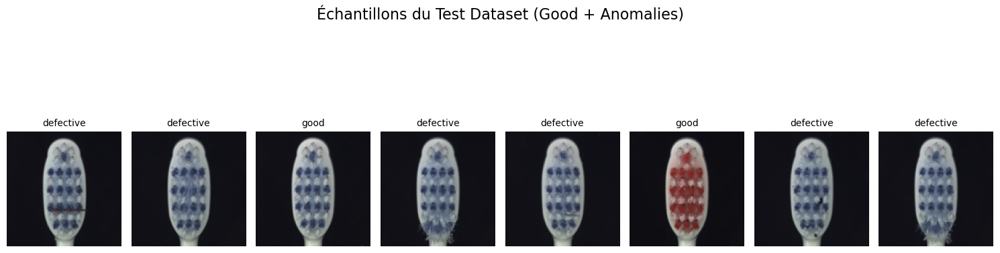

In [18]:
plot_samples(toothbrush_train_dataset, "Échantillons du Train Dataset (Good)", n_samples=8)
plot_samples(toothbrush_test_dataset, "Échantillons du Test Dataset (Good + Anomalies)", n_samples=8)

# 2. Différents modèles pour la détection d'anomalies

## 2.1 Architecture générale

In [19]:
class Encoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=128):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 16x16 -> 8x8
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 8x8 -> 4x4
            nn.ReLU(),
            nn.Conv2d(256, latent_dim, kernel_size=4, stride=2, padding=1),  # 4x4 -> 2x2
            nn.ReLU(),
        )

    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim=128, out_channels=3):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, kernel_size=4, stride=2, padding=1),  # 2x2 -> 4x4
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 4x4 -> 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 8x8 -> 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1),  # 16x16 -> 32x32
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.decoder(x)

## 2.2 Modèles distincts

### 2.2.1 Auto encoder masqué

In [20]:
class MaskedAutoencoderModel(nn.Module):
    def __init__(self, latent_dim=128, mask_ratio=1/16):
        super(MaskedAutoencoderModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_ratio = mask_ratio

    def forward(self, x):
        x_masked = self.apply_mask(x)
        z = self.encoder(x_masked)
        return self.decoder(z), x_masked
    
    def apply_mask(self, x):
        x_masked = x.clone()
        mask = torch.rand_like(x[:, 0, :, :]) < self.mask_ratio
        mask = mask.unsqueeze(1).repeat(1, x.size(1), 1, 1)
        x_masked[mask] = 0
        return x_masked

### 2.2.2 Colorisation

In [21]:
class ColorizationModel(nn.Module):
    def __init__(self, latent_dim=128):
        super(ColorizationModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim, in_channels=1)  # Input grayscale
        self.decoder = Decoder(latent_dim=latent_dim, out_channels=3)  # Predict RGB

    def forward(self, x):
        grayscale_x = transforms.Grayscale()(x)  # Convert RGB to Grayscale
        z = self.encoder(grayscale_x)
        return self.decoder(z), grayscale_x

### 2.2.3 Inpainting modèle

In [22]:
class InpaintingModel(nn.Module):
    def __init__(self, latent_dim=128, mask_size=24):
        super(InpaintingModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_size = mask_size

    def forward(self, x):
        x_masked = self.apply_mask(x)
        z = self.encoder(x_masked)
        return self.decoder(z), x_masked
    
    def apply_mask(self, x):
        masked_x = x.clone()

        for i in range(masked_x.size(0)):
            ul_x = np.random.randint(0, x.size(2) - self.mask_size + 1)
            ul_y = np.random.randint(0, x.size(3) - self.mask_size + 1)
            masked_x[i, :, ul_x:ul_x+self.mask_size, ul_y:ul_y+self.mask_size] = 0

        return masked_x

# 3. Entrainements sur les différents jeux de données

In [23]:
def train_ssl_model(model, 
                    train_loader, 
                    test_loader, 
                    criterion,
                    optimizer,
                    device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
                    epochs=25):  # Exemple avec 25 époques

    train_losses = []
    val_losses = []

    model.to(device)

    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)
    
    for epoch in range(epochs):
        model.train()
        total_train_loss = 0
        for images, _ in train_loader:
            images = images.to(device)
            optimizer.zero_grad()
            output, _ = model(images) # Rajouter , _ 
            loss = criterion(output, images)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        model.eval()
        total_val_loss = 0
        with torch.no_grad():
            for images, _ in test_loader:
                images = images.to(device)
                output, _ = model(images)
                loss = criterion(output, images)
                total_val_loss += loss.item()
        avg_val_loss = total_val_loss / len(test_loader)
        val_losses.append(avg_val_loss)
        
        scheduler.step(avg_val_loss)
        
        for param_group in optimizer.param_groups:
            current_lr = param_group['lr']
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Current LR: {current_lr:.6f}")

    return model.encoder, train_losses, val_losses

## 3.1 Grid-search selon latent dim et learning rate (pour chaque jeu de donnée, modèle)

In [24]:
from Analyse_training_results import (
    plot_training_curves_with_val_loss, plot_val_loss_per_dataset_final
)
warnings.filterwarnings("ignore", category=UserWarning)

In [25]:
file_path = 'training_results.csv'
data = pd.read_csv(file_path)

data['Final Val Loss'] = data['Validation Loss'].apply(lambda x: eval(x)[-1])

top_1_per_config = (
    data.sort_values(by=['Model', 'Dataset', 'Final Val Loss'])
    .groupby(['Model', 'Dataset'])
    .head(1)
    .reset_index(drop=True)
)

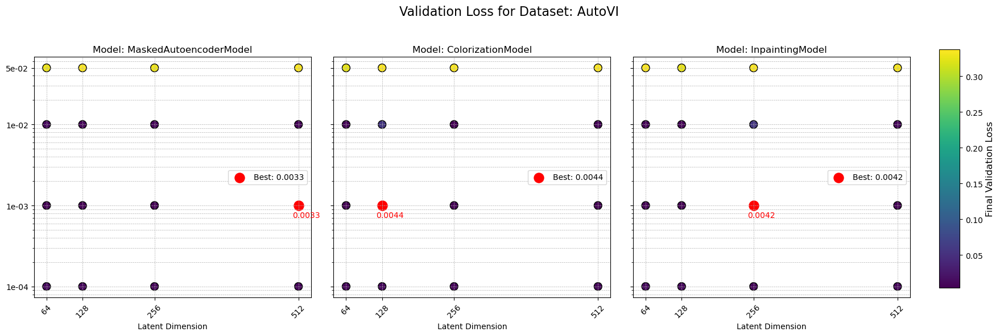

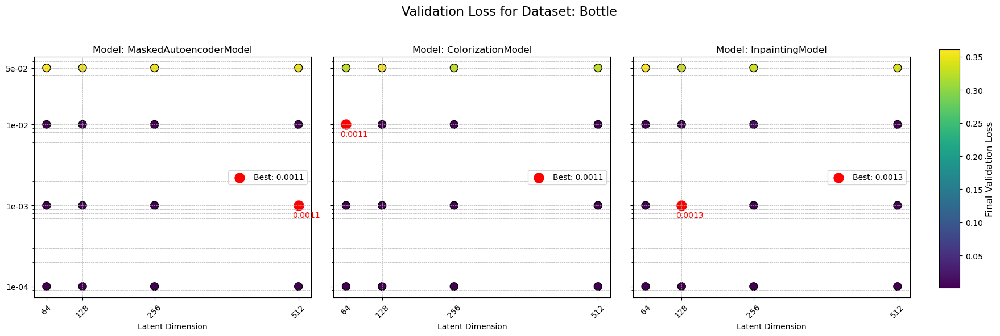

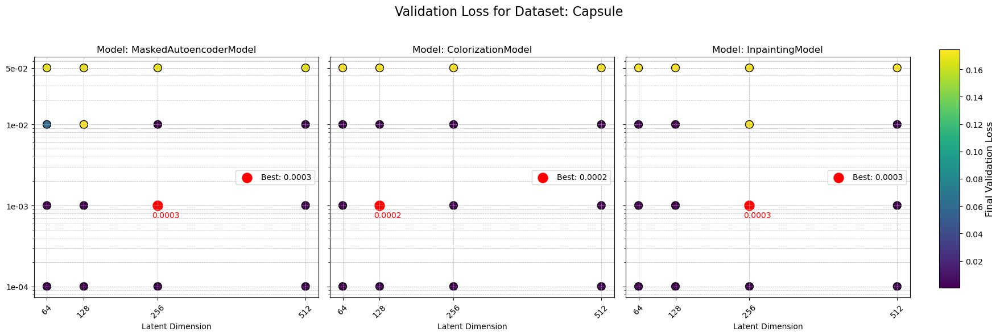

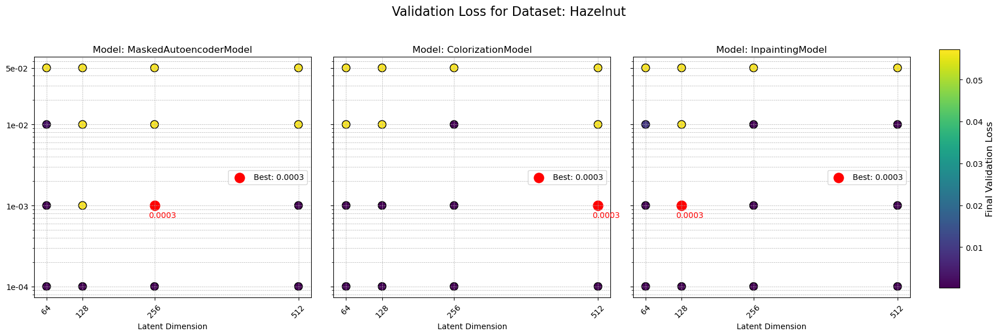

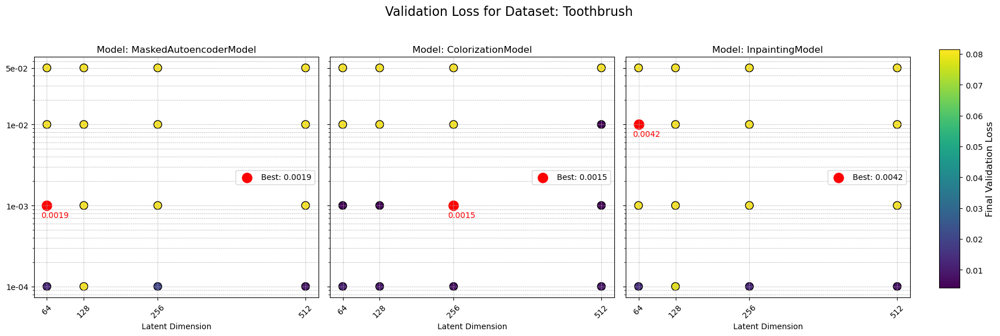

In [26]:
plot_val_loss_per_dataset_final(data)

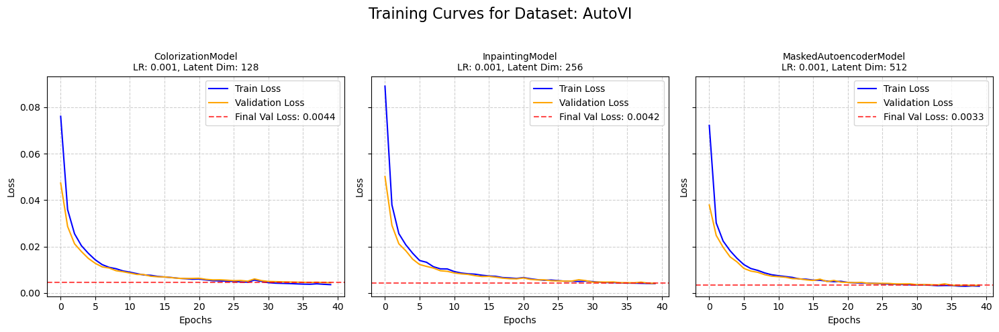

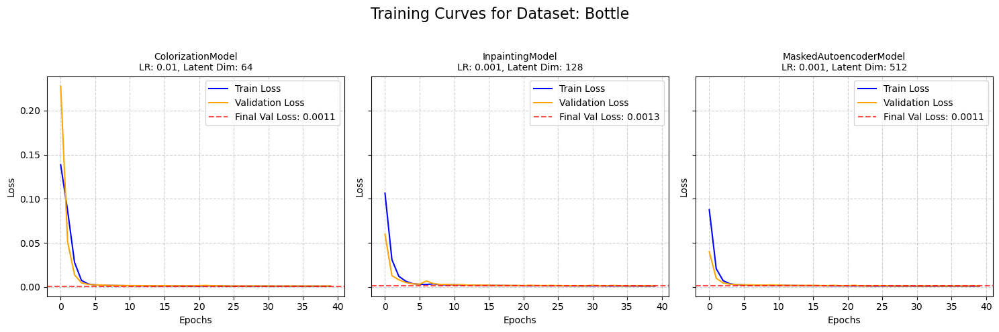

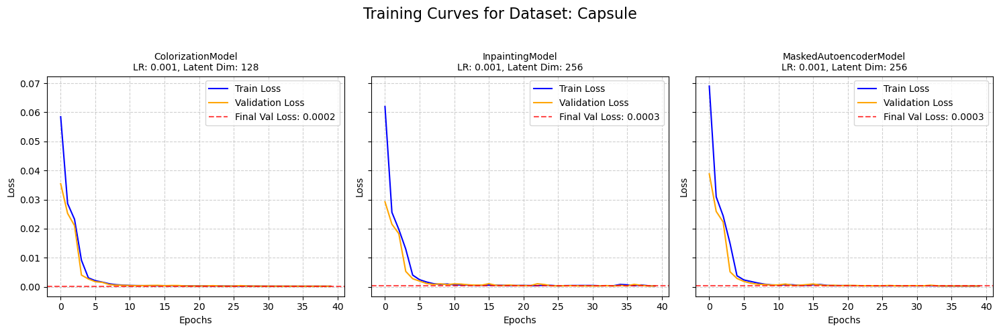

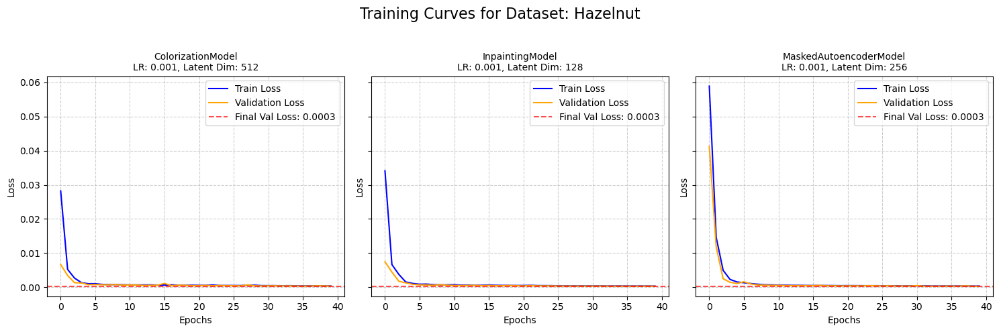

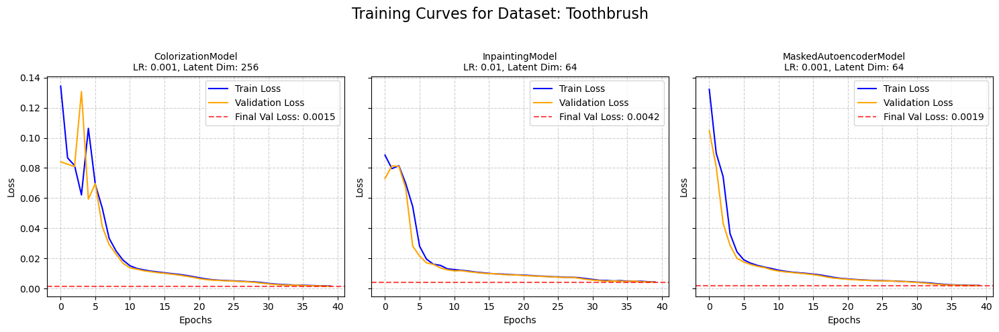

In [27]:
plot_training_curves_with_val_loss(top_1_per_config, data)

## 3.2 Chargement des meilleurs modèles (poids enregistrés)

In [28]:
Model = {
    'AutoVI': {
        'mae': MaskedAutoencoderModel(latent_dim=512),
        'colorization': ColorizationModel(latent_dim=128),
        'inpainting': InpaintingModel(latent_dim=256)
    },
    'bottle': {
        'mae': MaskedAutoencoderModel(latent_dim=512),
        'colorization': ColorizationModel(latent_dim=64),
        'inpainting': InpaintingModel(latent_dim=128)
    },
    'capsule': {
        'mae': MaskedAutoencoderModel(latent_dim=256),
        'colorization': ColorizationModel(latent_dim=128),
        'inpainting': InpaintingModel(latent_dim=256)
    },
    'hazelnut': {
        'mae': MaskedAutoencoderModel(latent_dim=256),
        'colorization': ColorizationModel(latent_dim=512),
        'inpainting': InpaintingModel(latent_dim=128)
    },
    'toothbrush': {
        'mae': MaskedAutoencoderModel(latent_dim=64),
        'colorization': ColorizationModel(latent_dim=64),
        'inpainting': InpaintingModel(latent_dim=512)
    }
}

In [29]:

# Charger les poids des modèles
Model['AutoVI']['mae'].load_state_dict(torch.load("Modeles/mae_model_AutoVI.pth", weights_only=True))
Model['AutoVI']['colorization'].load_state_dict(torch.load("Modeles/colorization_model_AutoVI.pth", weights_only=True))
Model['AutoVI']['inpainting'].load_state_dict(torch.load("Modeles/Inpainting_model_AutoVI.pth", weights_only=True))

Model['bottle']['mae'].load_state_dict(torch.load("Modeles/mae_model_bottle.pth", weights_only=True))
Model['bottle']['colorization'].load_state_dict(torch.load("Modeles/colorization_model_bottle.pth", weights_only=True))
Model['bottle']['inpainting'].load_state_dict(torch.load("Modeles/Inpainting_model_bottle.pth", weights_only=True))

Model['capsule']['mae'].load_state_dict(torch.load("Modeles/mae_model_capsule.pth", weights_only=True))
Model['capsule']['colorization'].load_state_dict(torch.load("Modeles/colorization_model_capsule.pth", weights_only=True))
Model['capsule']['inpainting'].load_state_dict(torch.load("Modeles/Inpainting_model_capsule.pth", weights_only=True))

Model['hazelnut']['mae'].load_state_dict(torch.load("Modeles/mae_model_hazelnut.pth", weights_only=True))
Model['hazelnut']['colorization'].load_state_dict(torch.load("Modeles/colorization_model_hazelnut.pth", weights_only=True))
Model['hazelnut']['inpainting'].load_state_dict(torch.load("Modeles/Inpainting_model_hazelnut.pth", weights_only=True))

Model['toothbrush']['mae'].load_state_dict(torch.load("Modeles/mae_model_toothbrush.pth", weights_only=True))
Model['toothbrush']['colorization'].load_state_dict(torch.load("Modeles/colorization_model_toothbrush.pth", weights_only=True))
Model['toothbrush']['inpainting'].load_state_dict(torch.load("Modeles/Inpainting_model_toothbrush.pth", weights_only=True))


<All keys matched successfully>

# 4. Observations résultats  : différentes reconstructions

In [30]:
def visualize_model_outputs_for_dataset(models, dataset_name, data_loader, device, num_examples=1):
    """
    Visualize outputs for a specific dataset's models (e.g., mae, colorization, inpainting).
    
    Args:
        models (dict): A dictionary of models, structured as Model['dataset_name']['model_type'].
        dataset_name (str): The name of the dataset (e.g., 'AutoVI').
        data_loader (DataLoader): DataLoader for the dataset.
        device (torch.device): The device to use (e.g., 'cuda' or 'cpu').
        num_examples (int): Number of examples to visualize per model type.
    """
    # Ensure the specified dataset exists in the models dictionary
    if dataset_name not in models:
        raise ValueError(f"Dataset '{dataset_name}' not found in the models dictionary.")

    # Move all relevant models to the specified device
    for model_type, model in models[dataset_name].items():
        model.to(device)
        model.eval()

    # Convert the DataLoader to a list for easier random sampling
    dataset = list(data_loader.dataset)

    # Randomly select `num_examples` images from the dataset
    random_indices = random.sample(range(len(dataset)), num_examples)
    random_images = [dataset[i][0] for i in random_indices]  # Extract only the images, ignoring labels
    original_images = torch.stack(random_images).to(device)

    # Prepare plot dimensions
    num_model_types = len(models[dataset_name])  # Number of models for this dataset
    fig, axes = plt.subplots(num_model_types, 3, figsize=(12, num_model_types * 4))  # 3 columns for each model

    if num_model_types == 1:
        axes = [axes]  # Wrap into a list if there's only one model

    # Iterate through the relevant models for the dataset
    row = 0
    for model_type, model in models[dataset_name].items():
        with torch.no_grad():
            # Pass the original images through the model to get outputs
            if model_type == 'mae':  # Assume MAE models return masked and reconstructed images
                reconstructed_images, masked_images = model(original_images)
                input_label = "Masked"
            elif model_type == 'colorization':  # Colorization models
                reconstructed_images, masked_images = model(original_images)
                input_label = "Grayscale"
            elif model_type == 'inpainting':  # Inpainting models
                reconstructed_images, masked_images = model(original_images)
                input_label = "Impainted"
            else:
                raise ValueError(f"Unknown model type: {model_type}")

        # Move results back to CPU for visualization
        original_images_cpu = original_images.cpu()
        reconstructed_images_cpu = reconstructed_images.cpu()
        masked_images_cpu = masked_images.cpu()

        # Plot the masked/grayscale/impainted input
        axes[row][0].imshow(
            masked_images_cpu[0].permute(1, 2, 0).squeeze(), cmap="gray"
        )
        axes[row][0].set_title(f"{dataset_name} - {model_type}: {input_label}")
        axes[row][0].axis("off")

        # Plot the original image
        axes[row][1].imshow(original_images_cpu[0].permute(1, 2, 0))
        axes[row][1].set_title(f"{dataset_name} - {model_type}: Original")
        axes[row][1].axis("off")

        # Plot the reconstructed image
        axes[row][2].imshow(reconstructed_images_cpu[0].permute(1, 2, 0))
        axes[row][2].set_title(f"{dataset_name} - {model_type}: Reconstructed")
        axes[row][2].axis("off")

        # Move to the next row
        row += 1

    plt.tight_layout()
    plt.show()


## 4-1 AutoVI

### 4-1-1 Sans anomalie

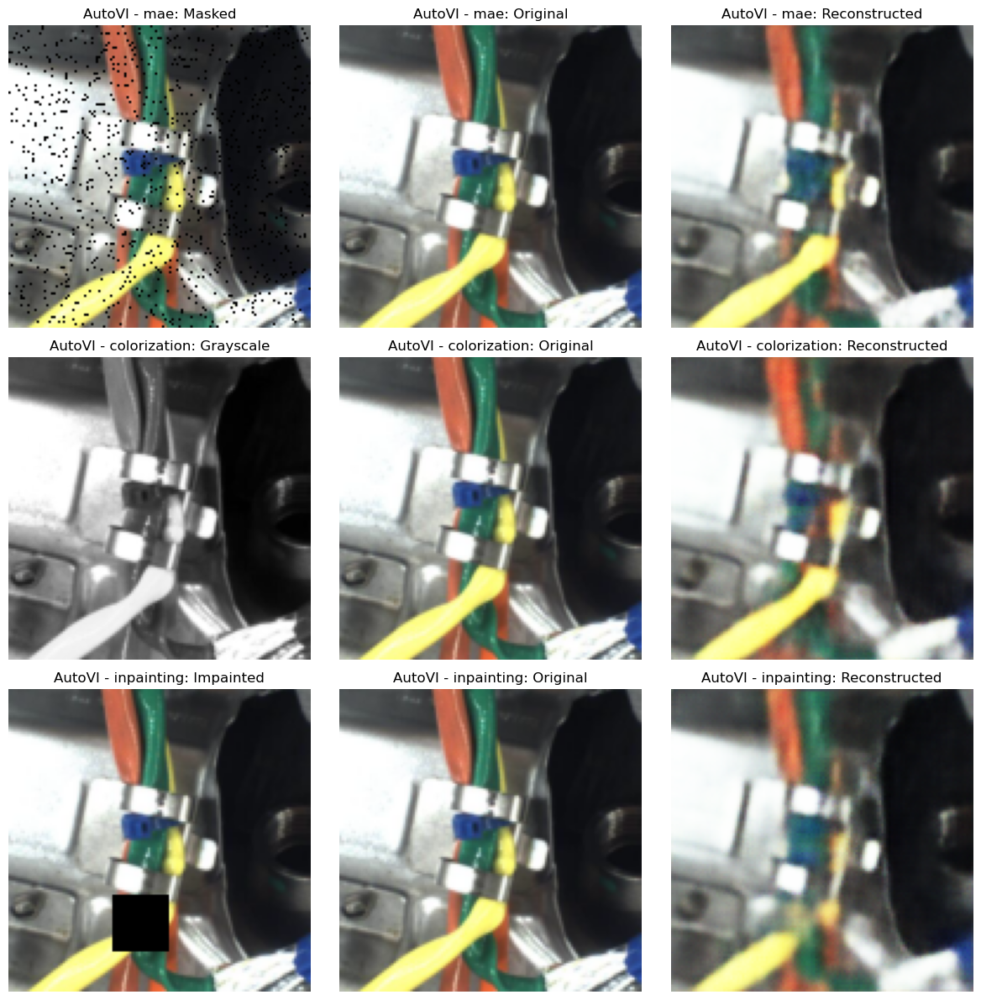

In [103]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'AutoVI', filtered_AutoVI_test_loader, device, num_examples=3)


### 4-1-2 Avec anomalie

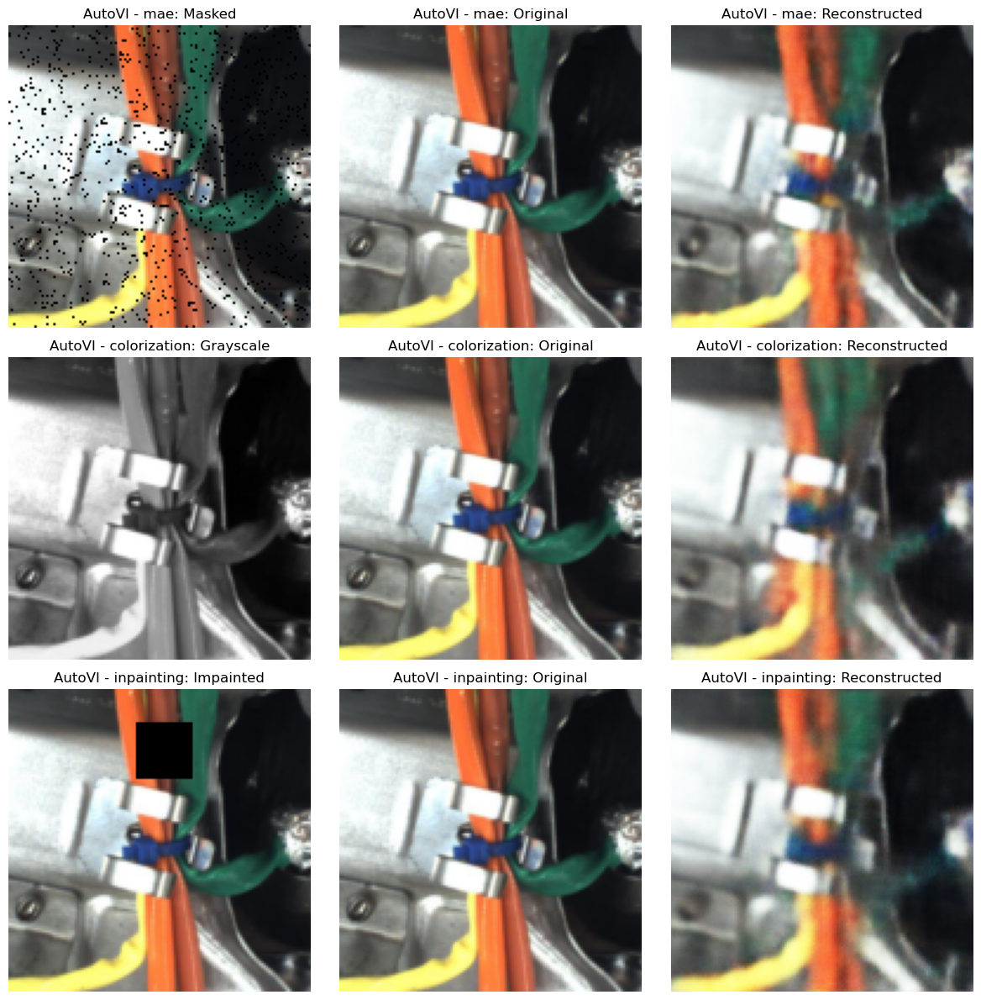

In [32]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'AutoVI', anomaly_AutoVI_test_loader, device, num_examples=3)


## 4-2 Bottle

### 4-2-1 Sans anomalie

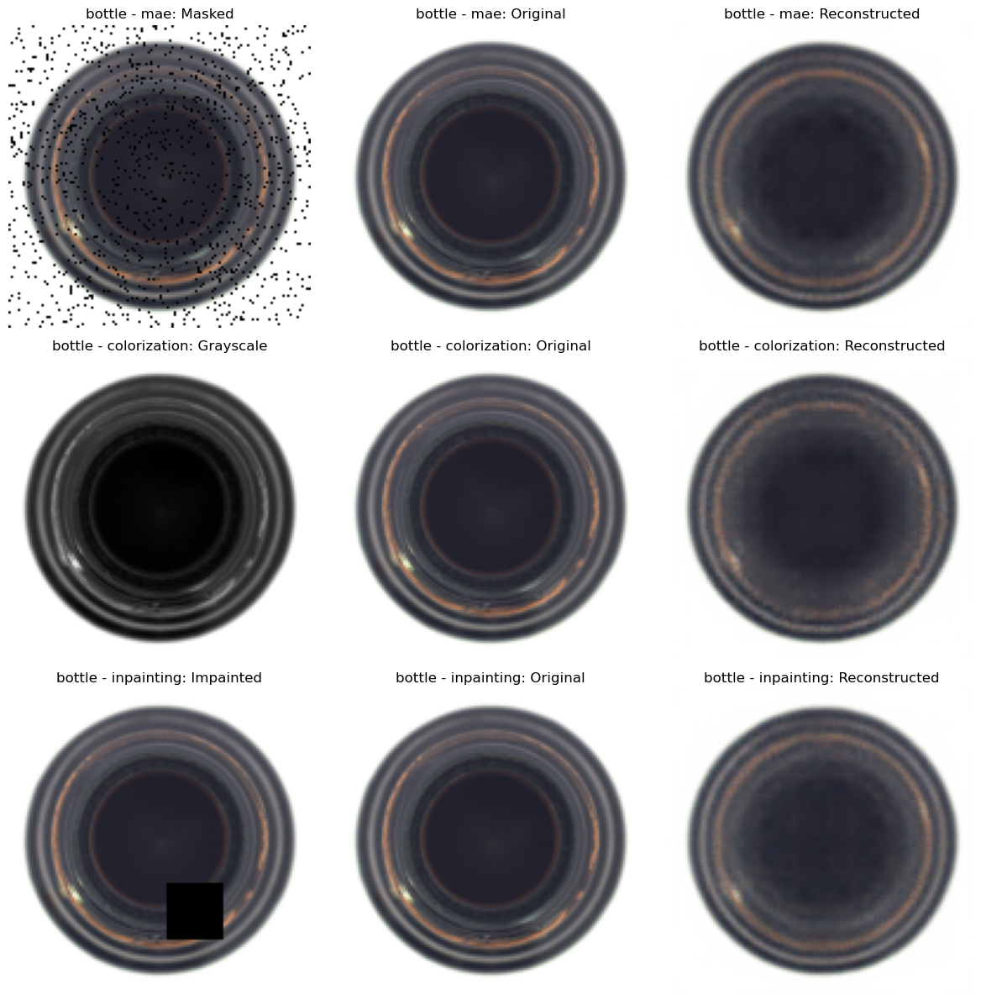

In [33]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'bottle', filtered_bottle_test_loader, device, num_examples=3)


### 4-2-2 Avec anomalie

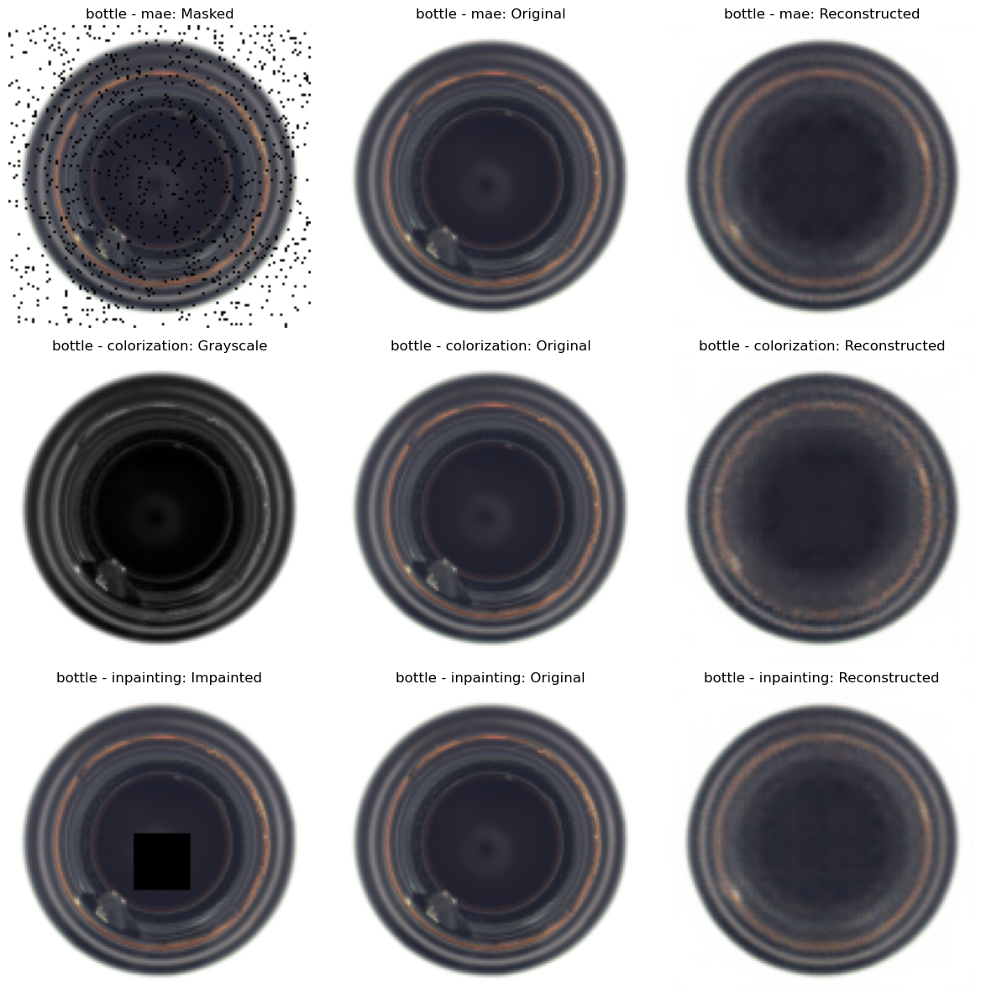

In [34]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'bottle', anomaly_bottle_test_loader, device, num_examples=3)


## 4-3 Capsule

### 4-3-1 Sans anomalie

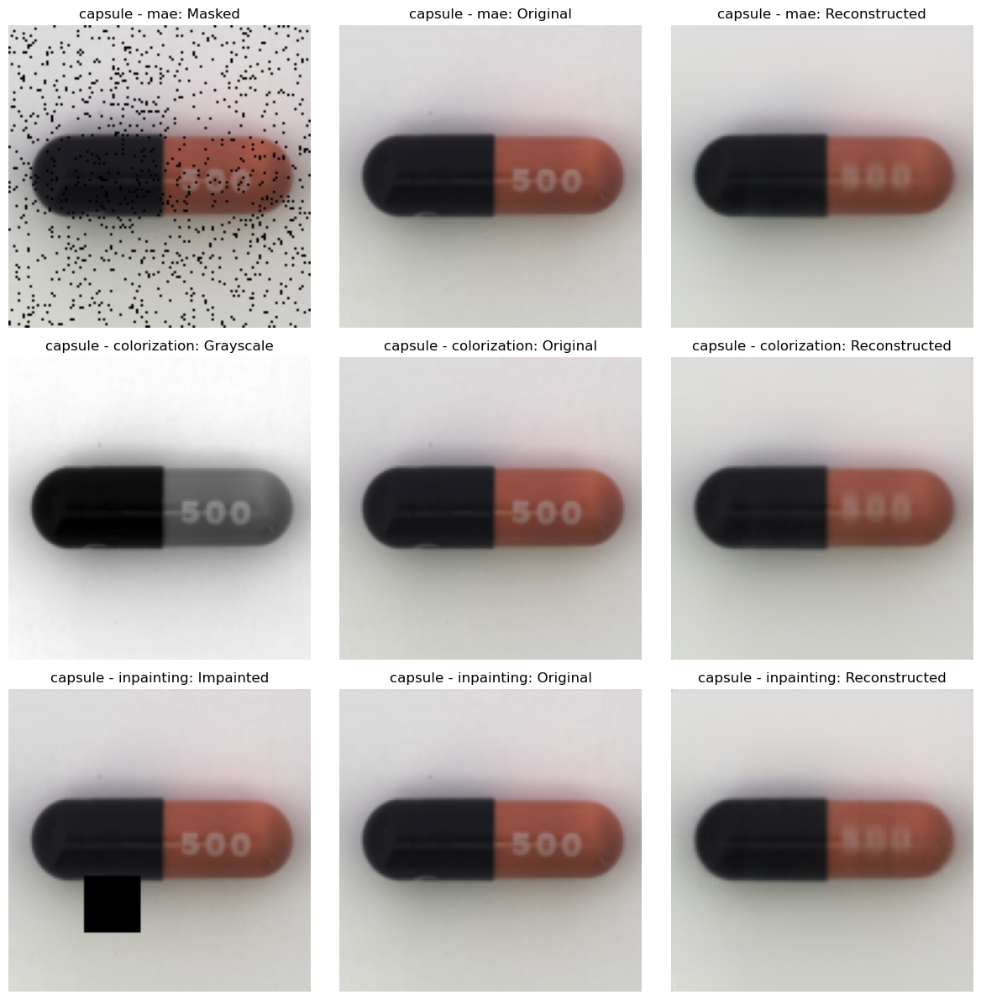

In [35]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'capsule', filtered_capsule_test_loader, device, num_examples=3)


### 4-3-2 Avec anomalie

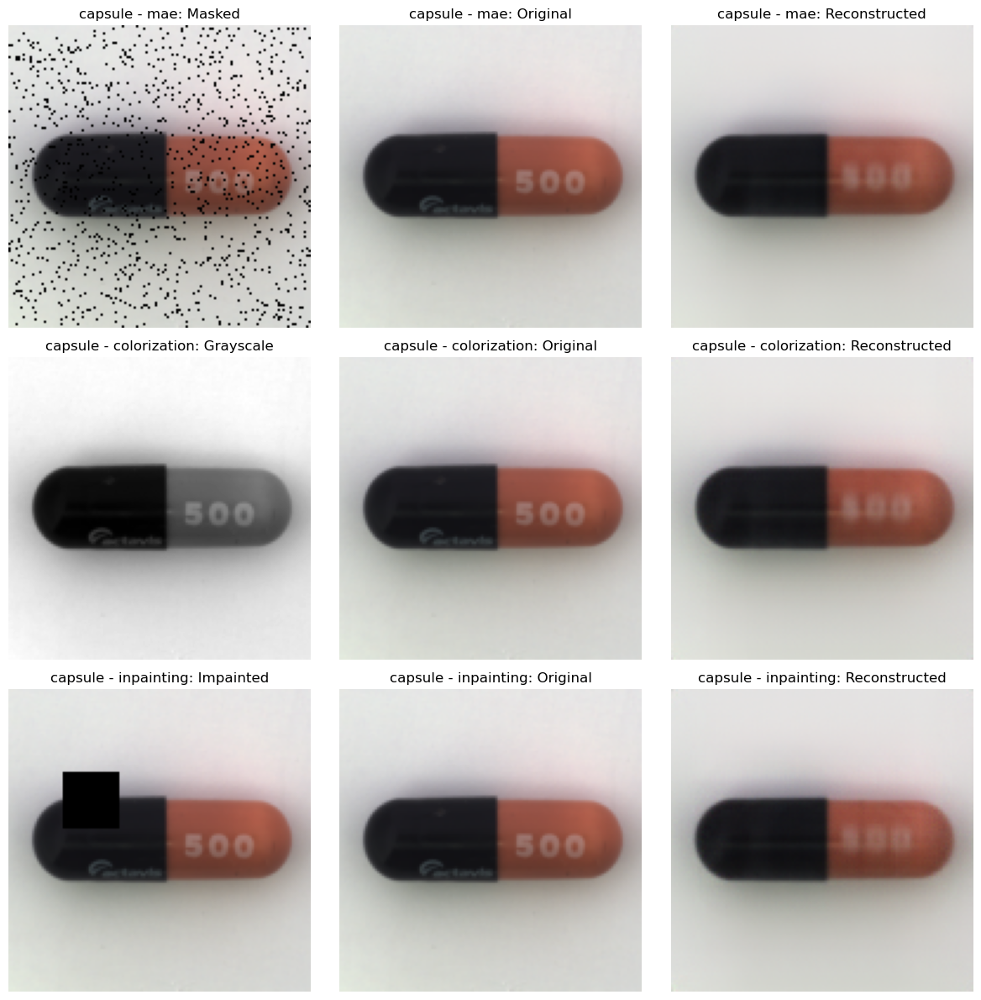

In [36]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'capsule', anomaly_capsule_test_loader, device, num_examples=3)


## 4-4 Hazelnut

### 4-4-1 Sans anomalie

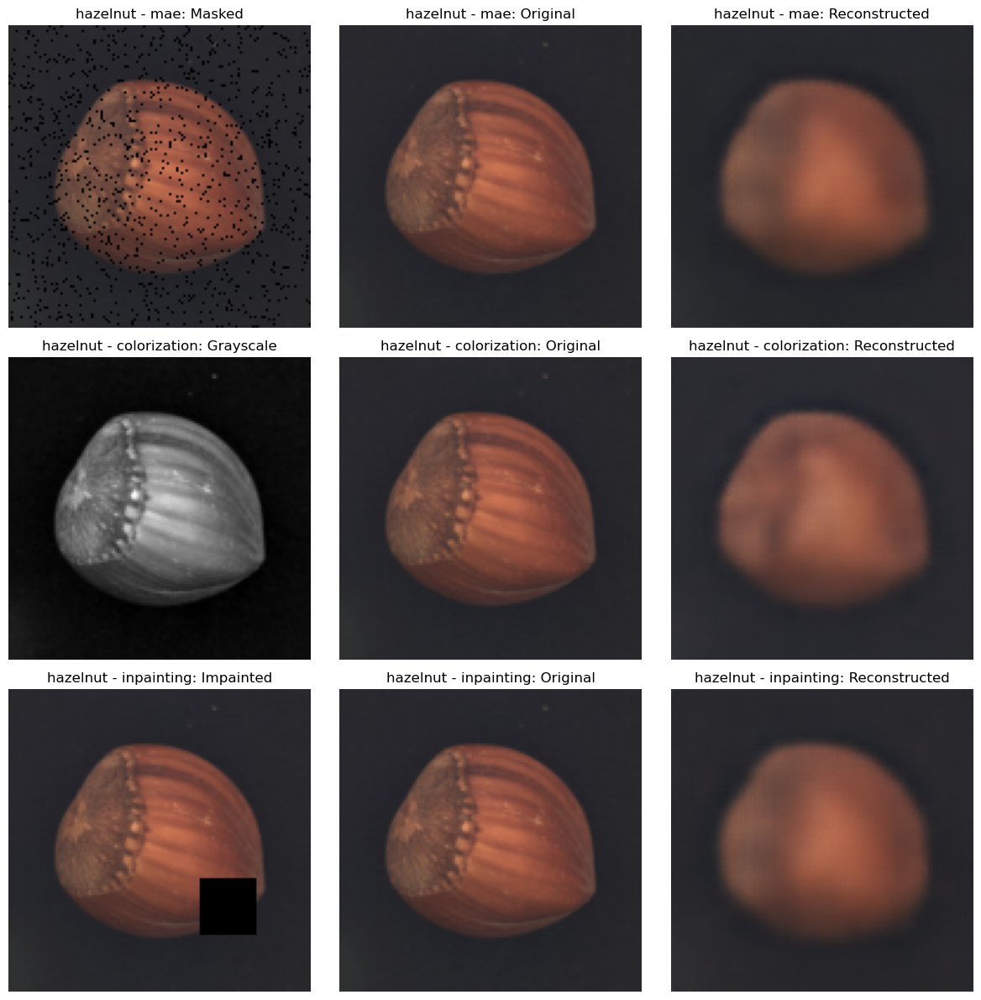

In [37]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'hazelnut', filtered_hazelnut_test_loader, device, num_examples=3)


### 4-4-2 Avec anomalie

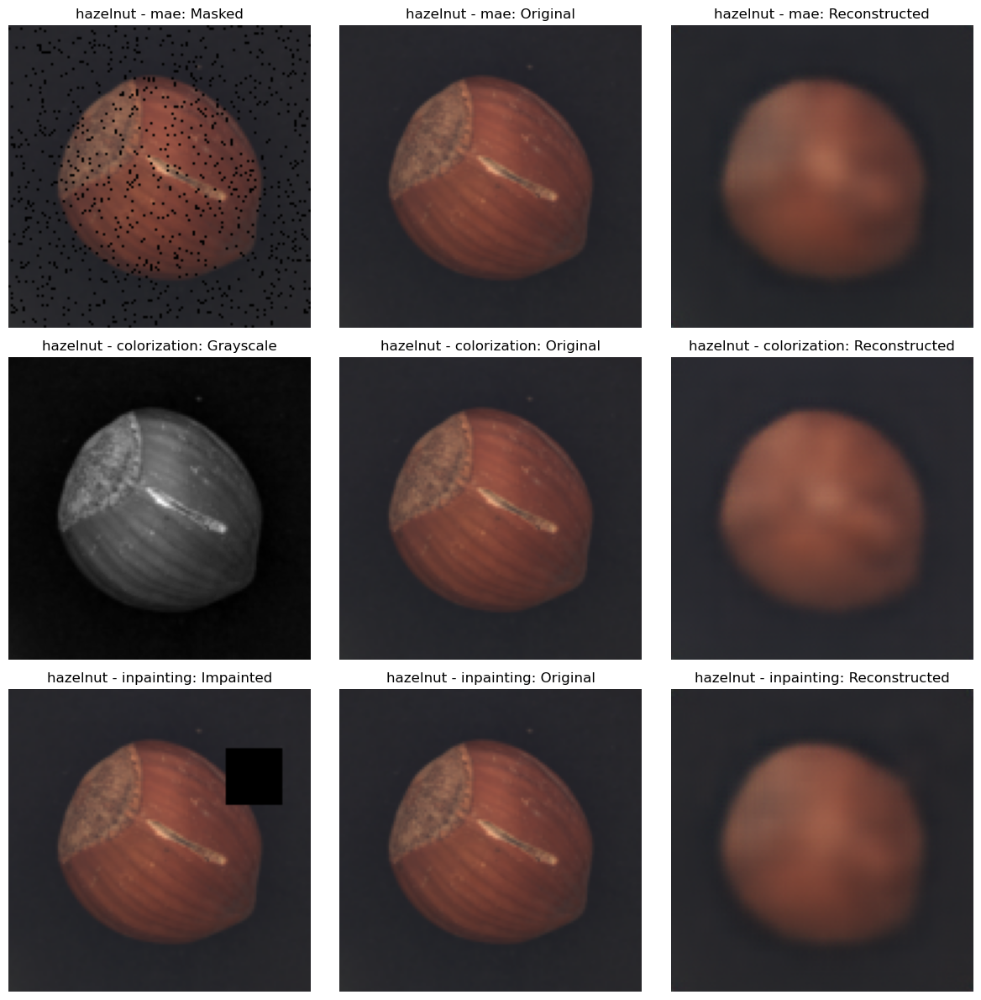

In [38]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'hazelnut', anomaly_hazelnut_test_loader, device, num_examples=3)


## 4-5 Toothbrush

### 4-5-1 Sans anomalie

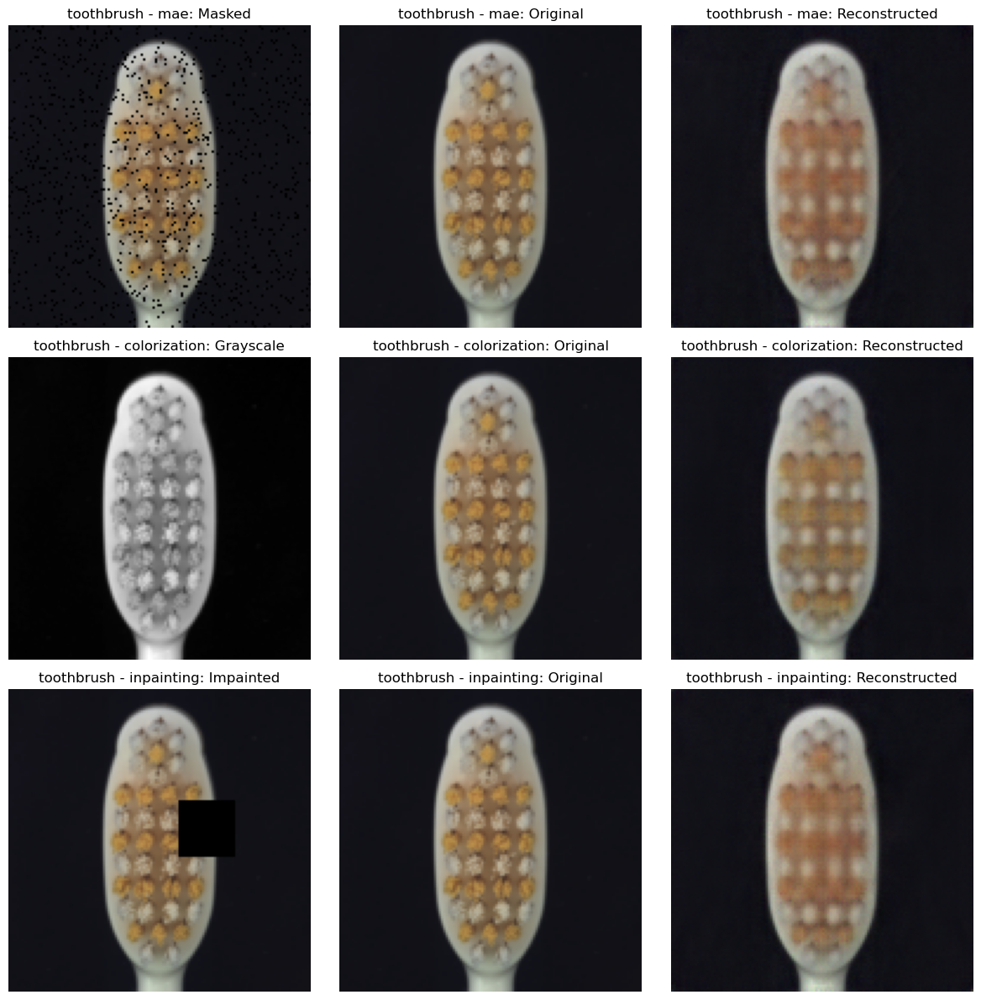

In [39]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'toothbrush', filtered_toothbrush_test_loader, device, num_examples=3)


### 4-5-2 Avec anomalie

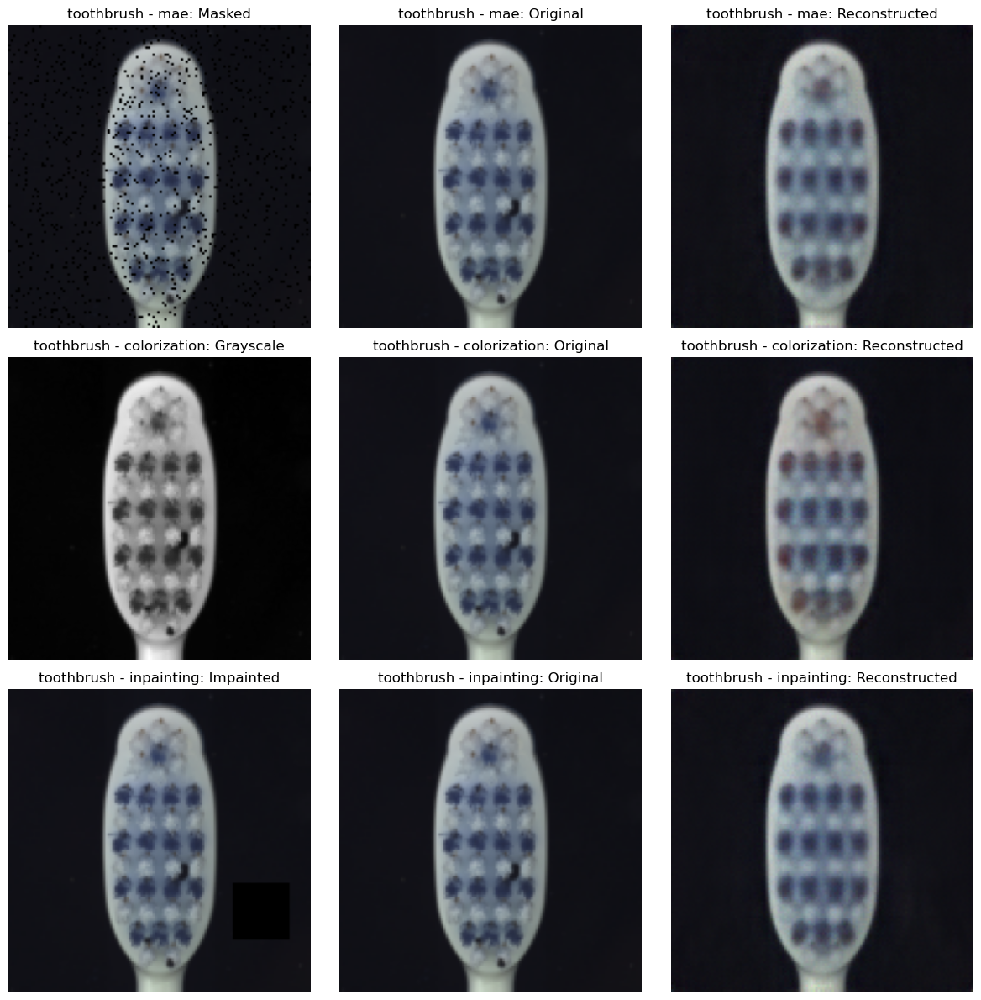

In [40]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

visualize_model_outputs_for_dataset(Model, 'toothbrush', anomaly_toothbrush_test_loader, device, num_examples=3)


# 5. Détection d'anomalie

In [41]:
def get_dataloaders(dataset_name):
    if dataset_name == "AutoVI":
        return filtered_AutoVI_test_loader, anomaly_AutoVI_test_loader, AutoVI_test_dataset, AutoVI_train_loader
    elif dataset_name == "bottle":
        return filtered_bottle_test_loader, anomaly_bottle_test_loader, bottle_test_dataset, bottle_train_loader
    elif dataset_name == "capsule":
        return filtered_capsule_test_loader, anomaly_capsule_test_loader, capsule_test_dataset, capsule_train_loader
    elif dataset_name == "hazelnut":
        return filtered_hazelnut_test_loader, anomaly_hazelnut_test_loader, hazelnut_test_dataset, hazelnut_train_loader
    elif dataset_name == "toothbrush":
        return filtered_toothbrush_test_loader, anomaly_toothbrush_test_loader, toothbrush_test_dataset, toothbrush_train_loader
    else:
        raise ValueError(f"Unknown dataset: {dataset_name}")

## 5.1 Compilation des résultats de détection d'anomalie dans un dictionnaire, avec différentes metrics 

In [42]:
# Fonction pour calculer le MSE entre les images et leurs reconstructions
def mse_scores(model, data_loader, device):
    model.eval()  # Mode évaluation
    scores = []  # Liste pour stocker les scores MSE
    with torch.no_grad():
        for images, _ in data_loader:  # Ignorer les labels
            images = images.to(device)
            # Reconstruction de l'image
            if hasattr(model, 'forward'):
                reconstructions, _ = model(images)
            else:
                raise ValueError("Le modèle ne possède pas de méthode 'forward'.")
            # Calcul du MSE entre l'image originale et sa reconstruction
            for img, recon in zip(images, reconstructions):
                mse = mse_loss(img, recon, reduction='mean').item()
                scores.append(mse)
    return np.array(scores)

In [43]:
def compute_threshold(scores, target_tpr=0.95):
    sorted_scores = np.sort(scores)
    target_index = int(np.ceil((1-target_tpr) * len(sorted_scores))) - 1

    # Handle edge cases
    target_index = max(0, target_index)  # Ensure index is non-negative
    target_index = min(len(sorted_scores) - 1, target_index)  # Ensure index is within bounds

    # Select the threshold
    threshold = sorted_scores[target_index]

    return threshold

In [44]:
def compute_roc_curve(model, dataset, max_loss, device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    """
    Calcule les scores de perte (MSE) et génère la courbe ROC en fonction du seuil max_loss.
    """
    model.eval()

    y_true = []
    y_scores = []

    with torch.no_grad():
        for image, label in dataset:
            image = image.unsqueeze(0).to(device)  # Ajouter une dimension batch: (1, 3, 128, 128)
            
            # Passer l'image à travers le modèle
            output, _ = model(image)
            
            # Calculer la MSE pour cette image
            mse_loss = torch.mean((output - image) ** 2).item()  # MSE entre l'image et la reconstruction
            
            # Ajouter la vraie étiquette (0 pour normal, 1 pour anomalie) et le score de perte
            if label == dataset.class_to_idx['good']:  # Si l'étiquette est 'good', c'est une image normale
                y_true.append(0)  # 0 pour normal
            else:  # Si l'étiquette n'est pas 'good', c'est une anomalie
                y_true.append(1)  # 1 pour anomalie
            
            y_scores.append(mse_loss)  # Ajouter le score de perte

    # Calculer la courbe ROC
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)

    return fpr, tpr, roc_auc

In [45]:
def confusion_matrix(scores_negatives, scores_positives, threshold):
    false_positives = np.sum(scores_negatives > threshold)
    true_postives = np.sum(scores_positives > threshold)
    true_negatives = np.sum(scores_negatives <= threshold)
    false_negatives = np.sum(scores_positives <= threshold)
    return false_positives, true_postives, true_negatives, false_negatives

def accuracy(scores_negatives, scores_positives, threshold):
    fp, tp, tn, fn = confusion_matrix(scores_negatives, scores_positives, threshold)
    return (tp + tn) / (tp + tn + fp + fn)

def precision_recall(scores_negatives, scores_positives, threshold):
    fp, tp, tn, fn = confusion_matrix(scores_negatives, scores_positives, threshold)
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    return precision, recall

def f_beta(scores_negatives, scores_positives, threshold, beta):
    precision, recall = precision_recall(scores_negatives, scores_positives, threshold)
    return (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall)

def calculate_accuracy_per_class(model, dataset, threshold, device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    """
    Calcule la proportion de bonnes prédictions pour chaque classe du dataset.
    """
    model.eval()
    correct_predictions = {class_name: 0 for class_name in dataset.classes}
    total_predictions = {class_name: 0 for class_name in dataset.classes}
    
    with torch.no_grad():
        for image, label in dataset:
            image = image.unsqueeze(0).to(device)  # Ajouter une dimension batch: (1, 3, 128, 128)
            
            # Passer l'image à travers le modèle
            output, _ = model(image)
            
            # Calculer la MSE pour cette image
            mse_loss = torch.mean((output - image) ** 2).item()  # MSE entre l'image et la reconstruction
            
            # Prédire l'étiquette en fonction du seuil
            predicted_label = 1 if mse_loss > threshold else 0  # 1 pour anomalie, 0 pour normal
            
            # Obtenir le nom de la classe
            class_name = dataset.classes[label]
            
            # Vérifier si la prédiction est correcte
            is_anomaly = 1 if class_name != 'good' else 0  # 1 pour anomalie, 0 pour normal
            if predicted_label == is_anomaly:
                correct_predictions[class_name] += 1
            total_predictions[class_name] += 1
    
    # Calculer les proportions de bonnes prédictions
    accuracy_per_class = {
        class_name: correct / total if total > 0 else 0
        for class_name, (correct, total) in zip(correct_predictions.keys(), zip(correct_predictions.values(), total_predictions.values()))
    }
    
    return accuracy_per_class

In [106]:
def plot_confusion_matrix(results, model_name, dataset_name):

    try:
        cm = results[dataset_name][model_name]['confusion_matrix']
        labels = ['good', 'defective']
        
        # Prepare confusion matrix values
        cm_values = np.array([
            [cm['true_negatives'], cm['false_positives']],
            [cm['false_negatives'], cm['true_positives']]
        ])

        # Plot the confusion matrix
        plt.figure(figsize=(6, 6))
        sns.heatmap(cm_values, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.title(f'Confusion Matrix for {model_name} on {dataset_name}')
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.show()

    except KeyError:
        print(f"Error: Results for model '{model_name}' or dataset '{dataset_name}' not found.")

In [104]:
# Dictionnaire pour enregistrer les résultats
def create_results(target_tpr = 0.95):
    results = {}
    
    # Appareil (CPU ou GPU)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Liste des TPR cibles
    
    beta = 1  # Beta pour le F1-score (peut être ajusté)
    
    # Calcul des scores, seuils, courbes ROC, précisions par classe, et autres métriques
    for dataset_name, model_types in Model.items():
        # Obtenir les DataLoaders pour ce dataset
        print(f"Loading DataLoaders for {dataset_name}...")
        good_loader, anomaly_loader, datatest, train_loader = get_dataloaders(dataset_name)
    
        results[dataset_name] = {}
        for model_type, model in model_types.items():
            print(f"Processing {dataset_name} - {model_type}...")
    
            model.to(device)  # Charger le modèle sur l'appareil
            model.eval()
    
            # Scores pour les échantillons "good" (négatifs)
            scores_negatives = mse_scores(model, good_loader, device)
    
            # Scores pour les anomalies (positifs)
            scores_positives = mse_scores(model, anomaly_loader, device)



            

            ### Calcul seuil sur test --> calibration pour 95 % des anomalies détecté (au dessus du seuil)
            
            # Calcul du seuil
            threshold = compute_threshold(scores_positives, target_tpr=target_tpr)

            ### Calcul seuil sur train --> calibration pour 95 % des good détecté (en dessous du seuil)

            #scores_positives_train = mse_scores(model, train_loader, device)
            #threshold = compute_threshold(scores_positives_train, target_tpr=1-target_tpr)
            


            
    
            # Calculer la courbe ROC
            fpr, tpr, roc_auc = compute_roc_curve(model, datatest, threshold, device)
    
            # Calculer les précisions par classe
            accuracy_per_class = calculate_accuracy_per_class(model, datatest, threshold, device)
    
            # Calculer les métriques globales
            fp, tp, tn, fn = confusion_matrix(scores_negatives, scores_positives, threshold)
            global_accuracy = accuracy(scores_negatives, scores_positives, threshold)
            precision, recall = precision_recall(scores_negatives, scores_positives, threshold)
            f1_score = f_beta(scores_negatives, scores_positives, threshold, beta)
    
            # Enregistrer les résultats
            results[dataset_name][model_type] = {
                "scores_negatives": scores_negatives,
                "scores_positives": scores_positives,
                "thresholds": threshold,
                "fpr": fpr.tolist(),
                "tpr": tpr.tolist(),
                "roc_auc": roc_auc,
                "accuracy_per_class": accuracy_per_class,
                "confusion_matrix": {
                    "false_positives": fp,
                    "true_positives": tp,
                    "true_negatives": tn,
                    "false_negatives": fn,
                },
                "global_accuracy": global_accuracy,
                "precision": precision,
                "recall": recall,
                "f1_score": f1_score,
            }
    return results

"""
results_90 = create_results(target_tpr = 0.90)

# Sauvegarder `results` dans un fichier pickle avec un nom spécifique
with open("results_90.pkl", "wb") as pickle_file:
    pickle.dump(results_90, pickle_file)

print(f"Results saved")


results_95 = create_results(target_tpr = 0.95)

# Sauvegarder `results` dans un fichier pickle avec un nom spécifique
with open("results_95.pkl", "wb") as pickle_file:
    pickle.dump(results_95, pickle_file)

print(f"Results saved")
"""

'\nresults_90 = create_results(target_tpr = 0.90)\n\n# Sauvegarder `results` dans un fichier pickle avec un nom spécifique\nwith open("results_90.pkl", "wb") as pickle_file:\n    pickle.dump(results_90, pickle_file)\n\nprint(f"Results saved")\n\n\nresults_95 = create_results(target_tpr = 0.95)\n\n# Sauvegarder `results` dans un fichier pickle avec un nom spécifique\nwith open("results_95.pkl", "wb") as pickle_file:\n    pickle.dump(results_95, pickle_file)\n\nprint(f"Results saved")\n'

## 5.2 Analyse des résultats

In [48]:
from Plot_results_anomalies import (
    plot_histograms_for_dataset, plot_roc_curves_for_dataset, plot_accuracy_per_class_for_dataset, get_metrics_dataframe
)

In [49]:
# Charger `results` à partir du fichier pickle
with open("results_95.pkl", "rb") as pickle_file:
    results_95 = pickle.load(pickle_file)


In [50]:
# Charger `results` à partir du fichier pickle
with open("results_90.pkl", "rb") as pickle_file:
    results_90 = pickle.load(pickle_file)


In [92]:
# Charger `results` à partir du fichier pickle
with open("results_90_train.pkl", "rb") as pickle_file:
    results_90_train = pickle.load(pickle_file)


### 5.2.1 AutoVI

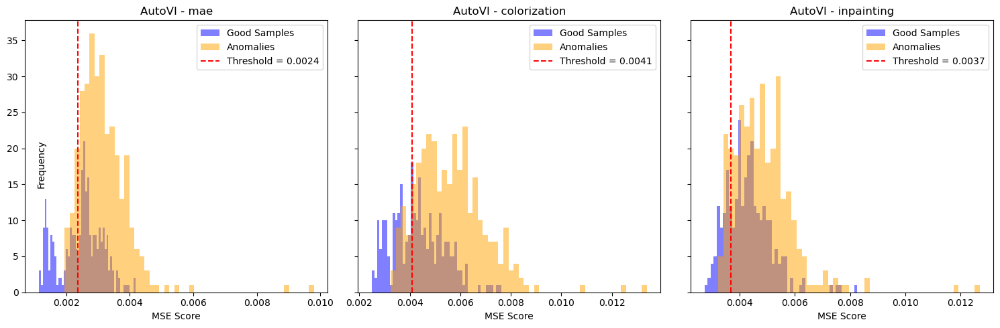

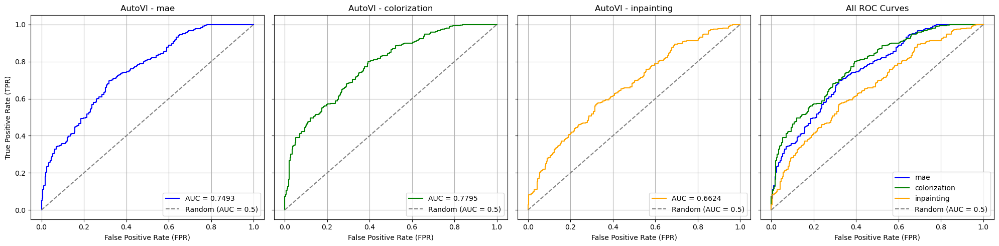

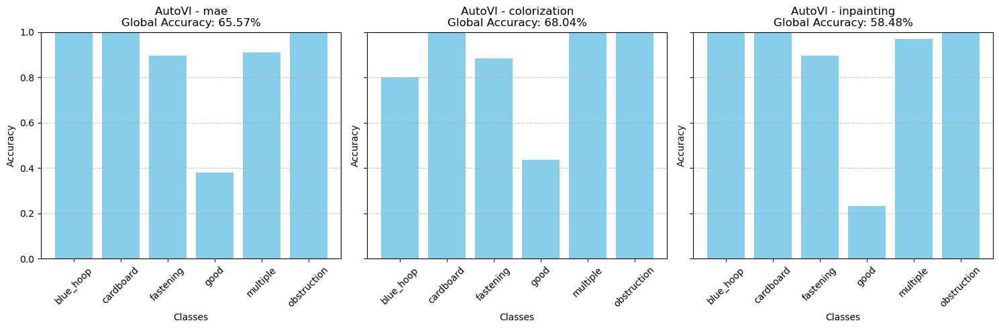

In [52]:
plot_histograms_for_dataset(results_90, "AutoVI")
plot_roc_curves_for_dataset(results_90, "AutoVI")
plot_accuracy_per_class_for_dataset(results_90, "AutoVI")

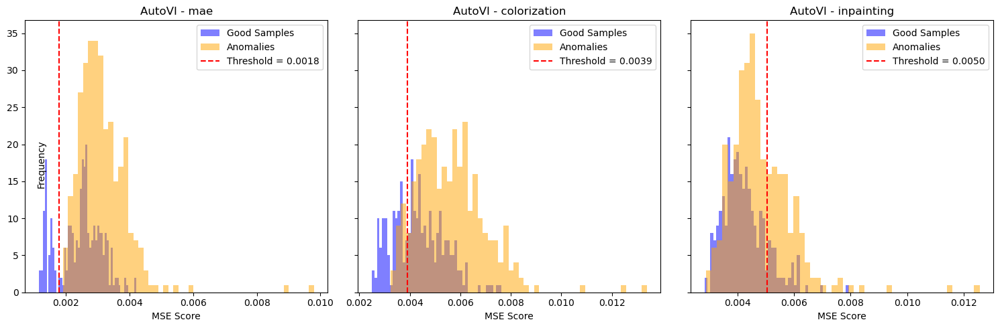

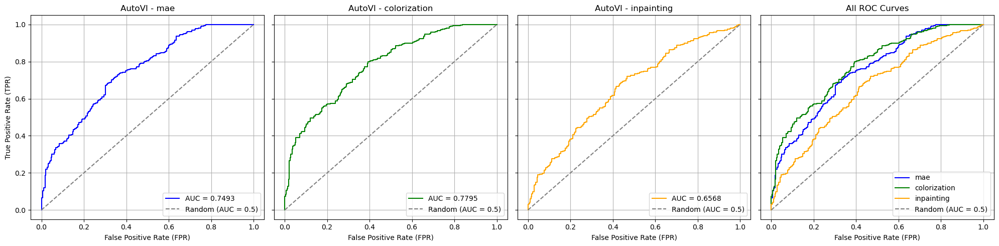

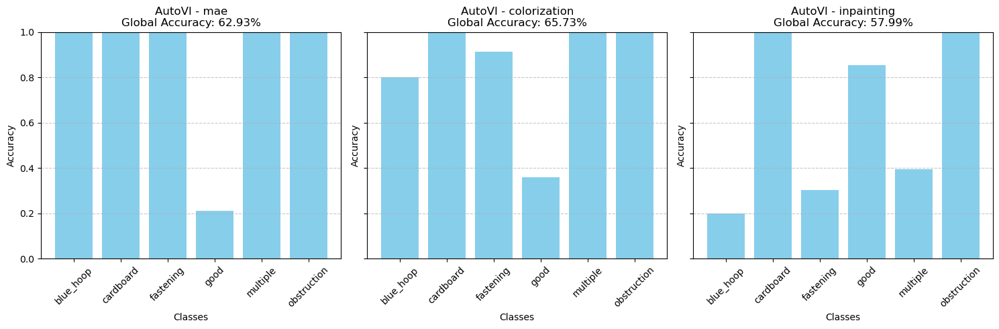

In [93]:
plot_histograms_for_dataset(results_90_train, "AutoVI")
plot_roc_curves_for_dataset(results_90_train, "AutoVI")
plot_accuracy_per_class_for_dataset(results_90_train, "AutoVI")

In [54]:
df_metrics = get_metrics_dataframe(results_95, "AutoVI")
df_metrics

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.748720,0.660626,0.607980,0.332555,0.617409,0.947205,0.747549
1,colorization,0.779547,0.650741,0.673605,0.355430,0.610000,0.947205,0.742092
2,inpainting,0.631928,0.583196,0.562145,0.422325,0.563771,0.947205,0.706837


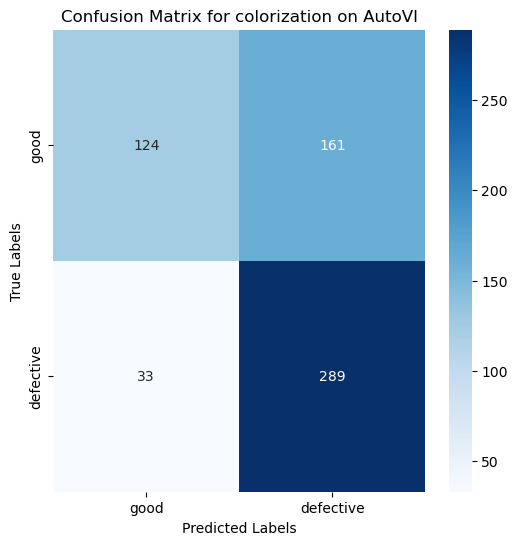

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.749341,0.655684,0.627448,0.345688,0.621505,0.897516,0.734435
1,colorization,0.779547,0.680395,0.673605,0.355430,0.642222,0.897516,0.748705
2,inpainting,0.662450,0.584843,0.581461,0.407229,0.568898,0.897516,0.696386


In [109]:
plot_confusion_matrix(results_90 ,model_name='colorization', dataset_name='AutoVI')


df_metrics = get_metrics_dataframe(results_90, "AutoVI")
df_metrics

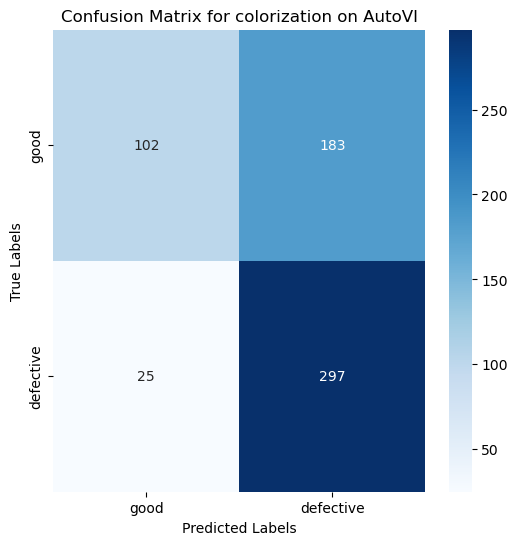

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.749275,0.629325,0.637001,0.352935,0.588665,1.000000,0.741082
1,colorization,0.779547,0.657331,0.673605,0.355430,0.618750,0.922360,0.740648
2,inpainting,0.656761,0.579901,0.580067,0.423639,0.721854,0.338509,0.460888


In [110]:
plot_confusion_matrix(results_90_train ,model_name='colorization', dataset_name='AutoVI')

df_metrics = get_metrics_dataframe(results_90_train, "AutoVI")
df_metrics

### 5.2.2 Bottle

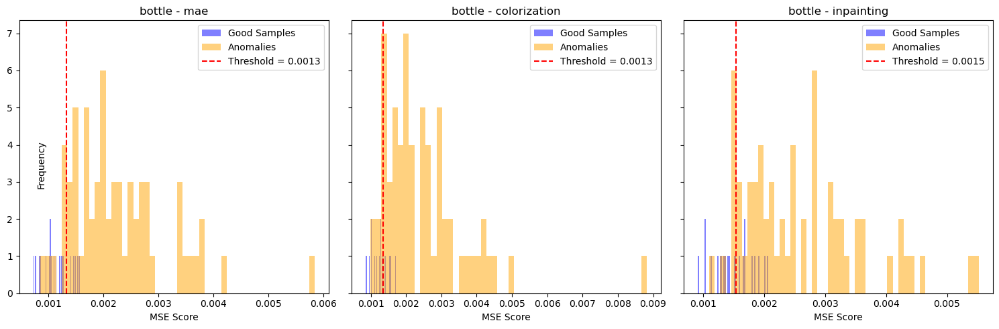

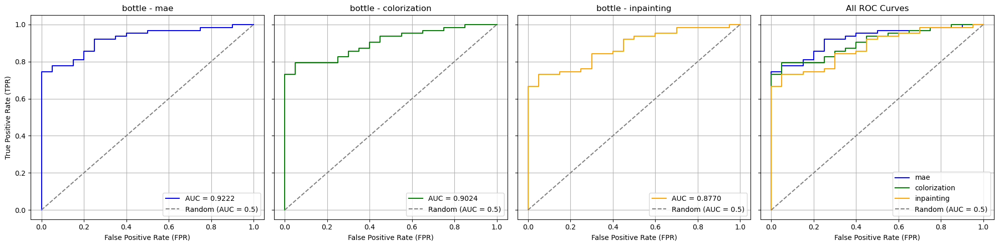

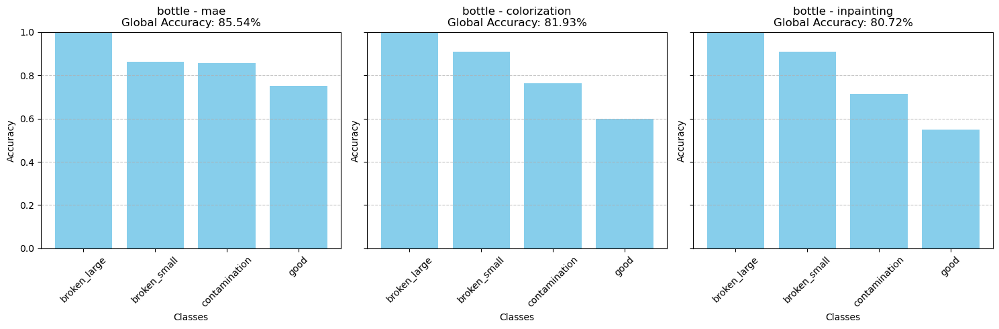

In [58]:
plot_histograms_for_dataset(results_90, "bottle")
plot_roc_curves_for_dataset(results_90, "bottle")
plot_accuracy_per_class_for_dataset(results_90, "bottle")

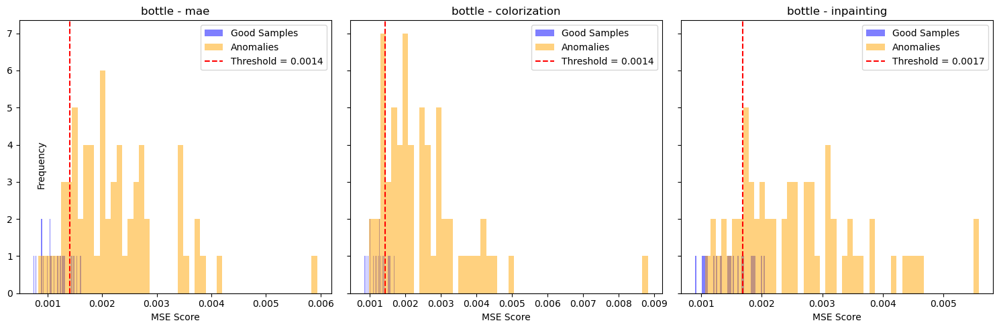

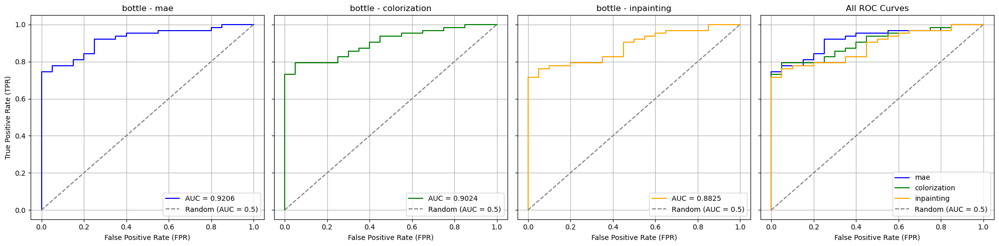

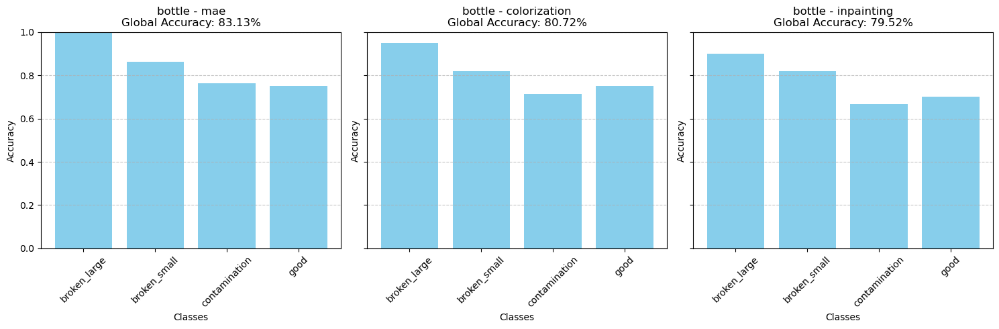

In [59]:
plot_histograms_for_dataset(results_90_train, "bottle")
plot_roc_curves_for_dataset(results_90_train, "bottle")
plot_accuracy_per_class_for_dataset(results_90_train, "bottle")

In [111]:
df_metrics = get_metrics_dataframe(results_95, "bottle")
df_metrics

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.918254,0.855422,0.804894,0.345833,0.880597,0.936508,0.907692
1,colorization,0.902381,0.819277,0.819444,0.425000,0.842857,0.936508,0.887218
2,inpainting,0.867460,0.783133,0.777167,0.396154,0.808219,0.936508,0.867647


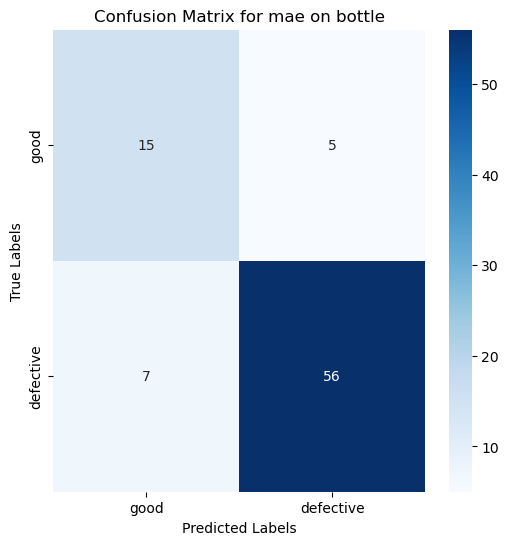

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.922222,0.855422,0.814574,0.368182,0.918033,0.888889,0.903226
1,colorization,0.902381,0.819277,0.819444,0.425000,0.875000,0.888889,0.881890
2,inpainting,0.876984,0.807229,0.783730,0.404167,0.861538,0.888889,0.875000


In [112]:
plot_confusion_matrix(results_90 ,model_name='mae', dataset_name='bottle')

df_metrics = get_metrics_dataframe(results_90, "bottle")
df_metrics

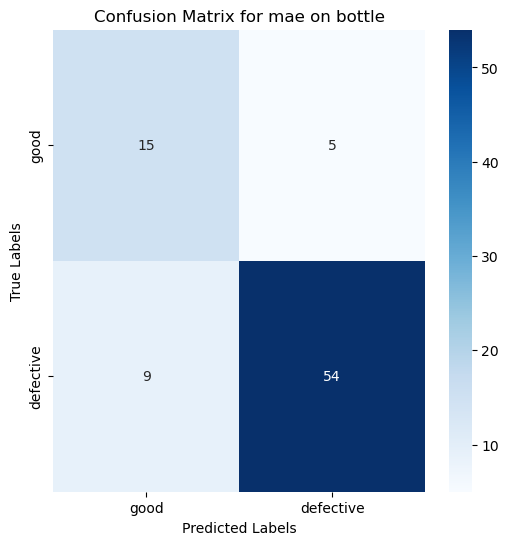

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.915873,0.831325,0.796032,0.370000,0.915254,0.857143,0.885246
1,colorization,0.902381,0.807229,0.819444,0.425000,0.912281,0.825397,0.866667
2,inpainting,0.870635,0.759036,0.772283,0.380769,0.905660,0.761905,0.827586


In [113]:
plot_confusion_matrix(results_90_train ,model_name='mae', dataset_name='bottle')

df_metrics = get_metrics_dataframe(results_90_train, "bottle")
df_metrics

### 5.2.3 Capsule

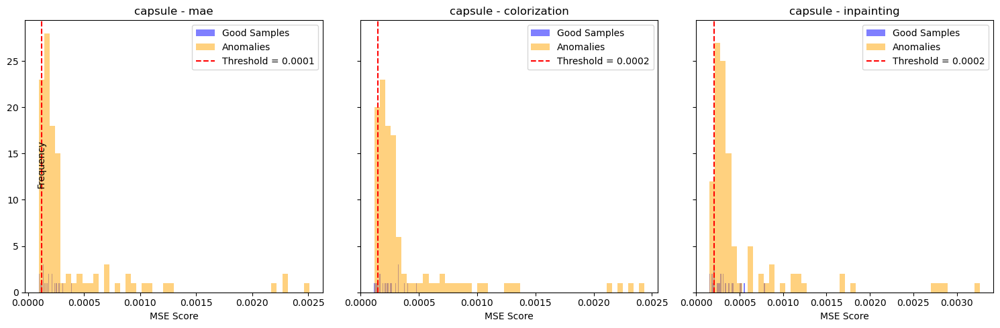

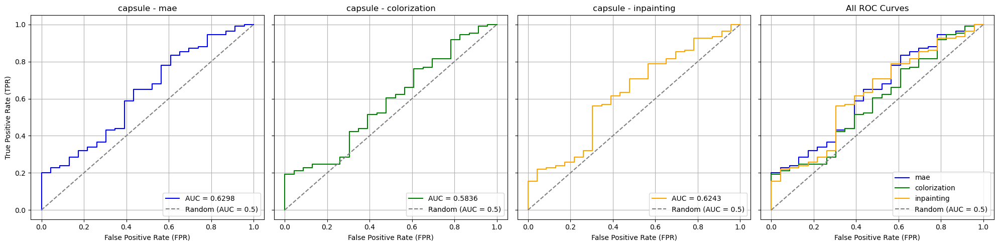

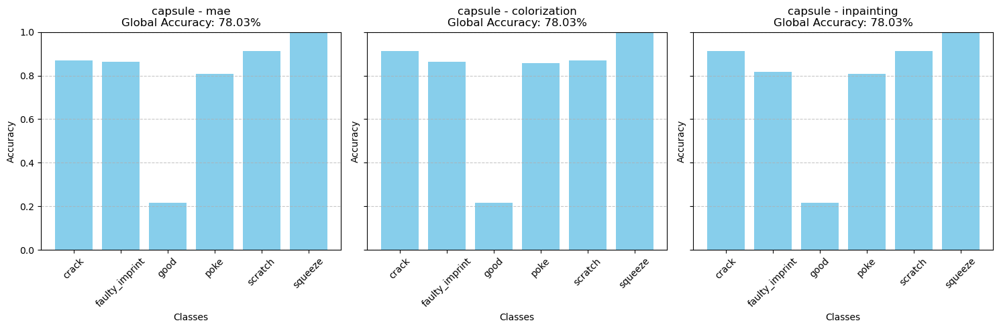

In [63]:
plot_histograms_for_dataset(results_90, "capsule")
plot_roc_curves_for_dataset(results_90, "capsule")
plot_accuracy_per_class_for_dataset(results_90, "capsule")

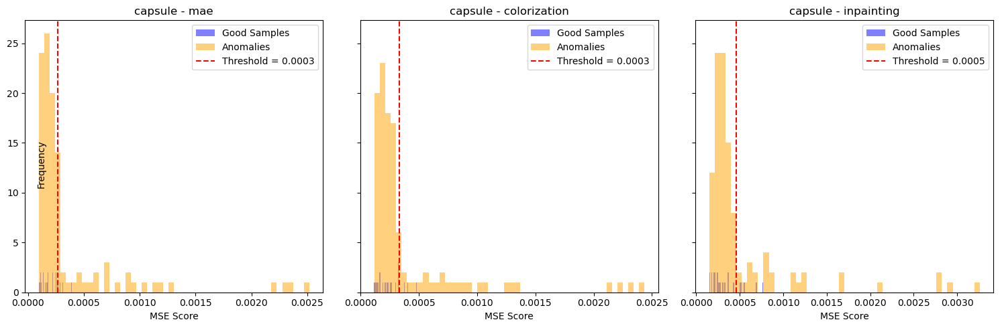

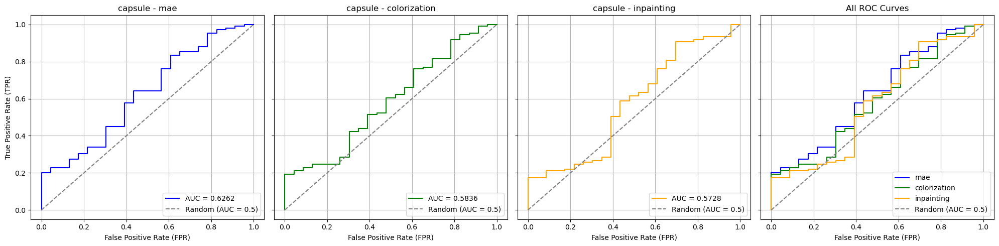

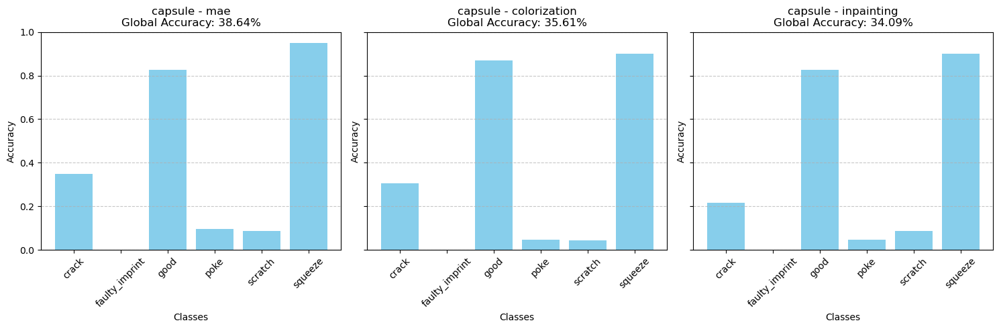

In [96]:
plot_histograms_for_dataset(results_90_train, "capsule")
plot_roc_curves_for_dataset(results_90_train, "capsule")
plot_accuracy_per_class_for_dataset(results_90_train, "capsule")

In [114]:
df_metrics = get_metrics_dataframe(results_95, "capsule")
df_metrics

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.626645,0.810606,0.601147,0.475000,0.844262,0.944954,0.891775
1,colorization,0.583566,0.803030,0.576889,0.493789,0.837398,0.944954,0.887931
2,inpainting,0.611089,0.787879,0.565514,0.457079,0.824000,0.944954,0.880342


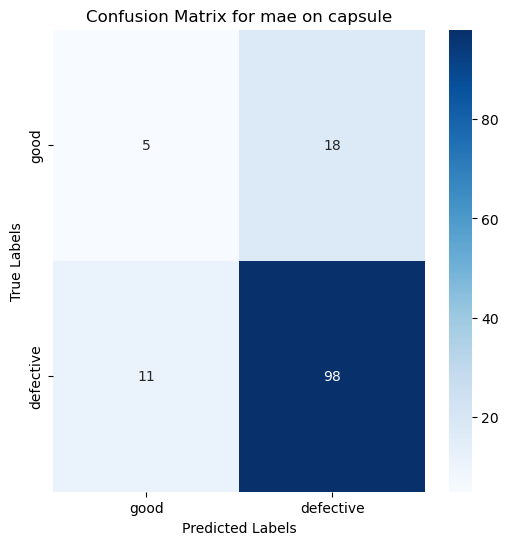

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.629836,0.780303,0.586113,0.463439,0.844828,0.899083,0.871111
1,colorization,0.583566,0.780303,0.576889,0.493789,0.844828,0.899083,0.871111
2,inpainting,0.624252,0.780303,0.568589,0.454451,0.844828,0.899083,0.871111


In [115]:
plot_confusion_matrix(results_90 ,model_name='mae', dataset_name='capsule')

df_metrics = get_metrics_dataframe(results_90, "capsule")
df_metrics

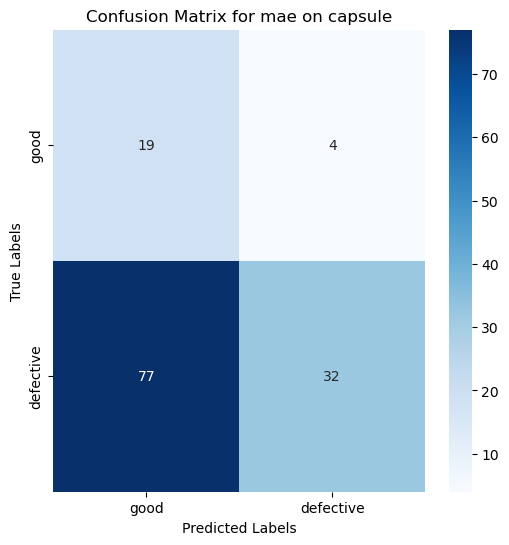

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.626247,0.386364,0.625127,0.506039,0.888889,0.293578,0.441379
1,colorization,0.583566,0.356061,0.576889,0.493789,0.900000,0.247706,0.388489
2,inpainting,0.572796,0.340909,0.527040,0.463387,0.843750,0.247706,0.382979


In [116]:
plot_confusion_matrix(results_90_train ,model_name='mae', dataset_name='capsule')

df_metrics = get_metrics_dataframe(results_90_train, "capsule")
df_metrics

### 5.2.4 Hazelnut




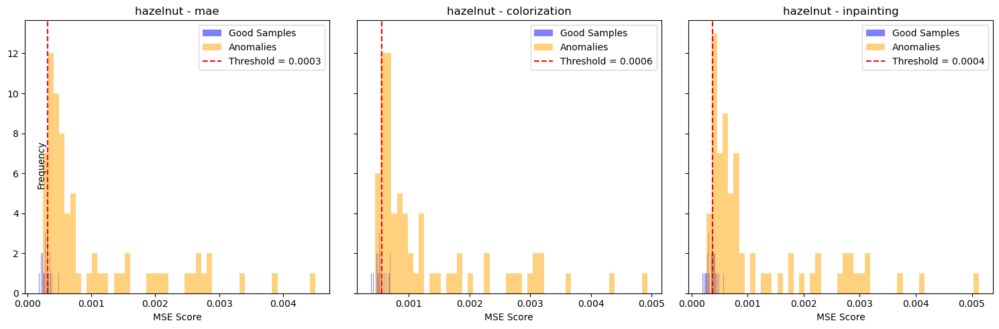

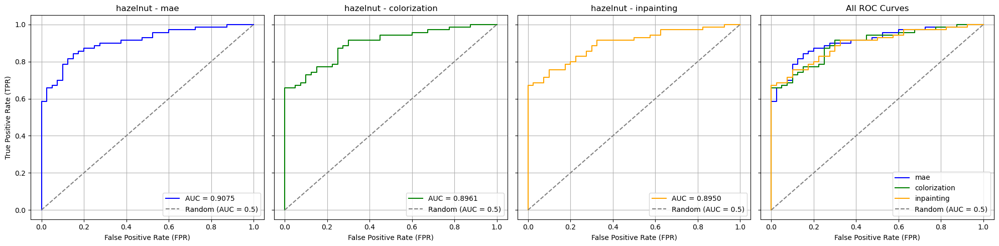

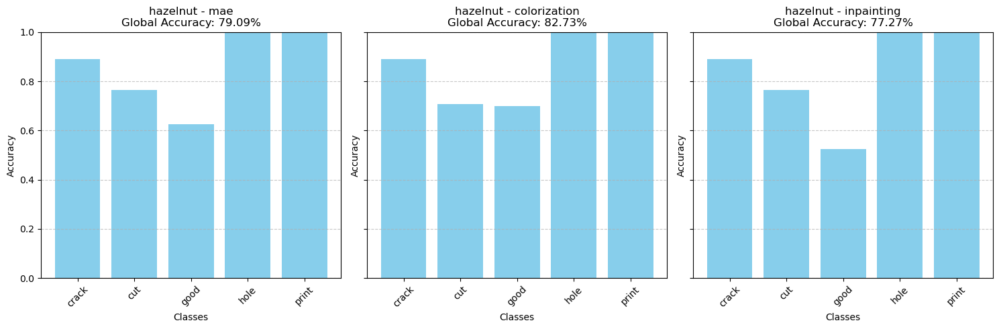

In [68]:
plot_histograms_for_dataset(results_90, "hazelnut")
plot_roc_curves_for_dataset(results_90, "hazelnut")
plot_accuracy_per_class_for_dataset(results_90, "hazelnut")

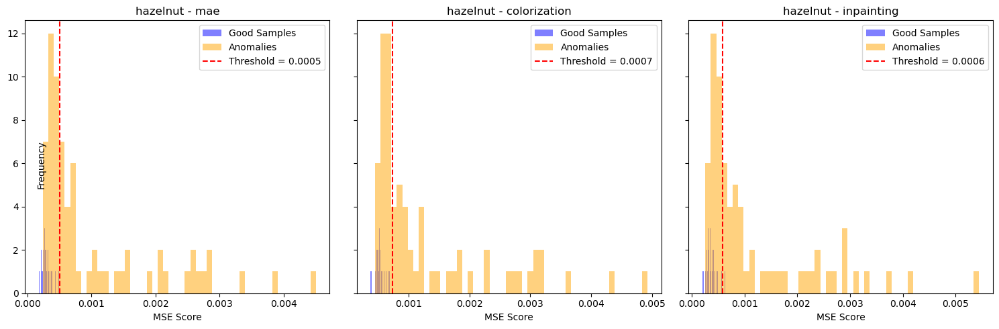

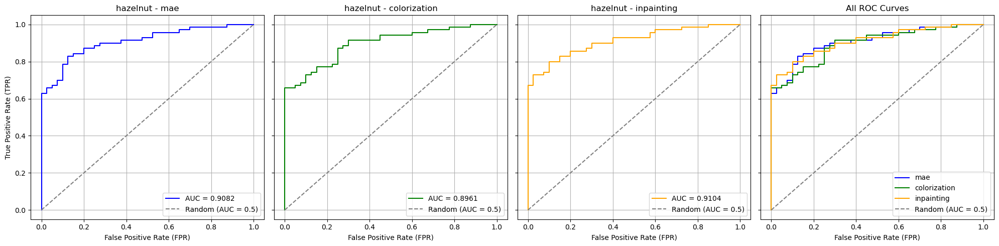

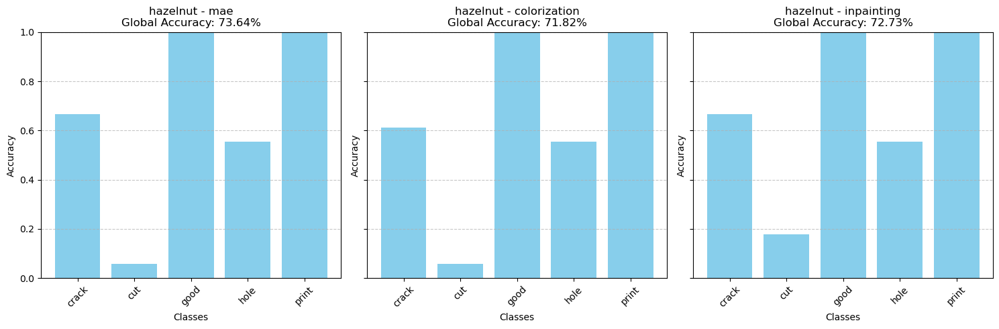

In [69]:
plot_histograms_for_dataset(results_90_train, "hazelnut")
plot_roc_curves_for_dataset(results_90_train, "hazelnut")
plot_accuracy_per_class_for_dataset(results_90_train, "hazelnut")

In [117]:
df_metrics = get_metrics_dataframe(results_95, "hazelnut")
df_metrics

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.907500,0.763636,0.800420,0.335294,0.750000,0.942857,0.835443
1,colorization,0.896071,0.745455,0.786161,0.339062,0.733333,0.942857,0.825000
2,inpainting,0.896786,0.763636,0.808647,0.359211,0.750000,0.942857,0.835443


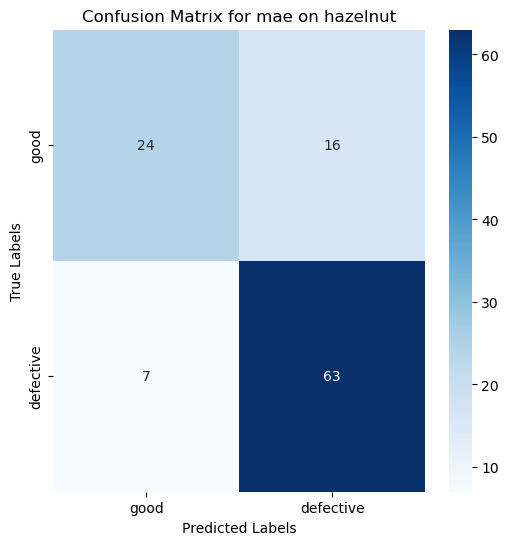

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.907500,0.790909,0.796429,0.305556,0.797468,0.9,0.845638
1,colorization,0.896071,0.827273,0.786161,0.339062,0.840000,0.9,0.868966
2,inpainting,0.895000,0.772727,0.795982,0.353125,0.777778,0.9,0.834437


In [118]:
plot_confusion_matrix(results_90 ,model_name='mae', dataset_name='hazelnut')

df_metrics = get_metrics_dataframe(results_90, "hazelnut")
df_metrics

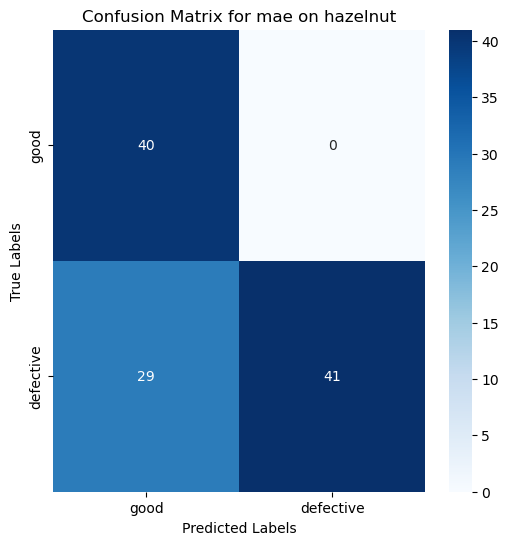

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.909643,0.736364,0.803125,0.320312,1.0,0.585714,0.738739
1,colorization,0.896071,0.718182,0.786161,0.339062,1.0,0.557143,0.715596
2,inpainting,0.888929,0.727273,0.804286,0.391667,1.0,0.571429,0.727273


In [119]:
plot_confusion_matrix(results_90_train ,model_name='mae', dataset_name='hazelnut')

df_metrics = get_metrics_dataframe(results_90_train, "hazelnut")
df_metrics

### 5.2.5 Toothbrush

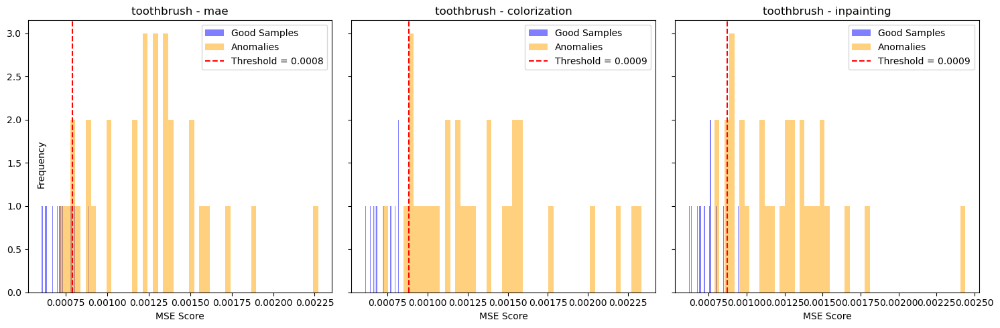

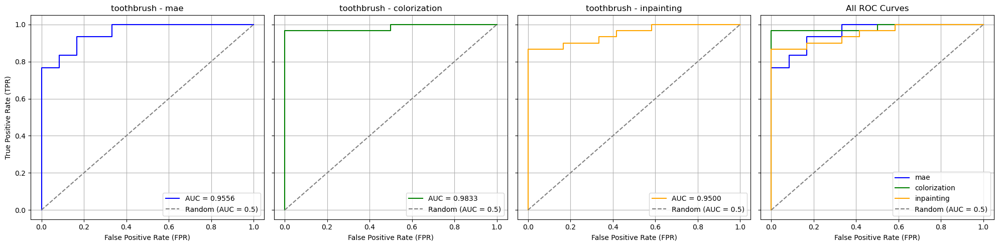

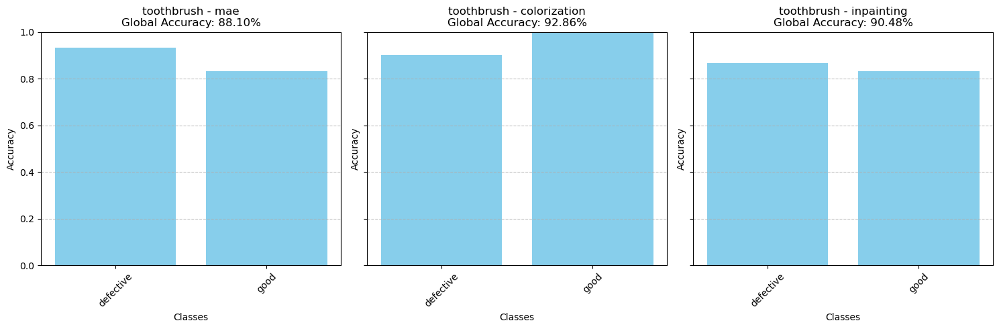

In [73]:
plot_histograms_for_dataset(results_90, "toothbrush")
plot_roc_curves_for_dataset(results_90, "toothbrush")
plot_accuracy_per_class_for_dataset(results_90, "toothbrush")

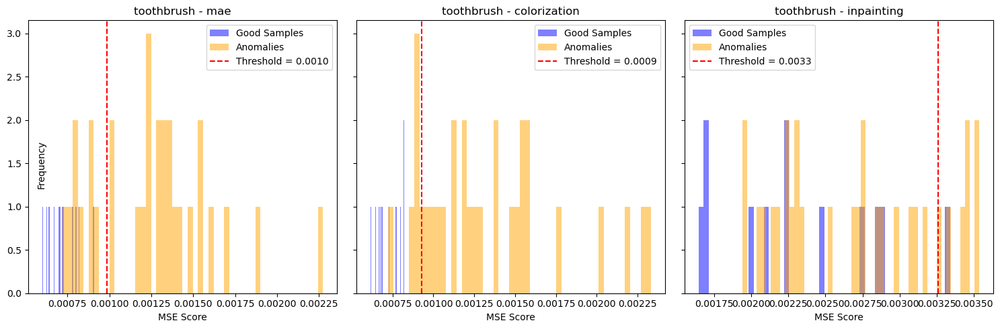

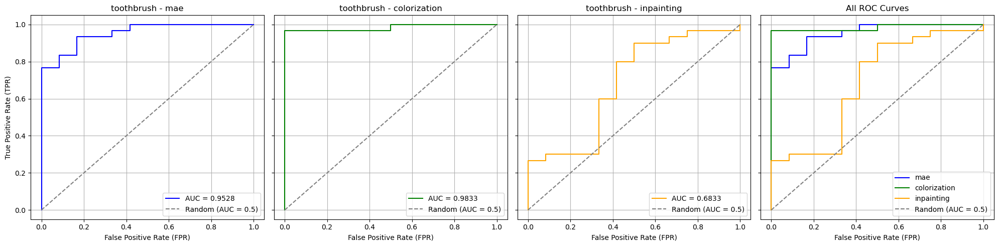

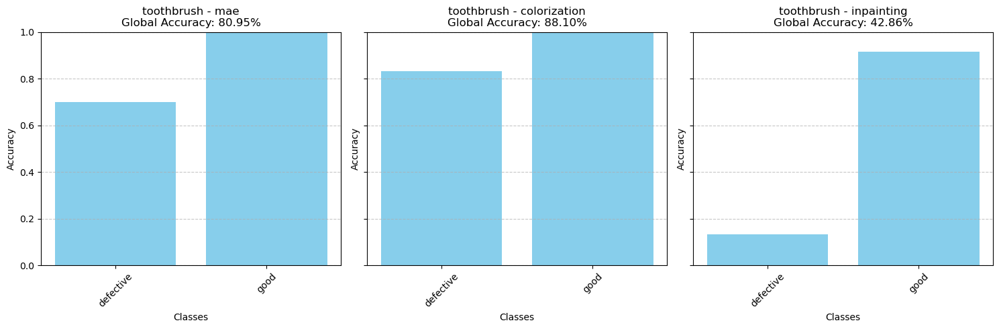

In [74]:
plot_histograms_for_dataset(results_90_train, "toothbrush")
plot_roc_curves_for_dataset(results_90_train, "toothbrush")
plot_accuracy_per_class_for_dataset(results_90_train, "toothbrush")

In [120]:
df_metrics = get_metrics_dataframe(results_95, "toothbrush")
df_metrics

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.952778,0.857143,0.752778,0.250000,0.875000,0.933333,0.903226
1,colorization,0.983333,0.952381,0.661111,0.333333,1.000000,0.933333,0.965517
2,inpainting,0.897222,0.904762,0.747917,0.343750,0.933333,0.933333,0.933333


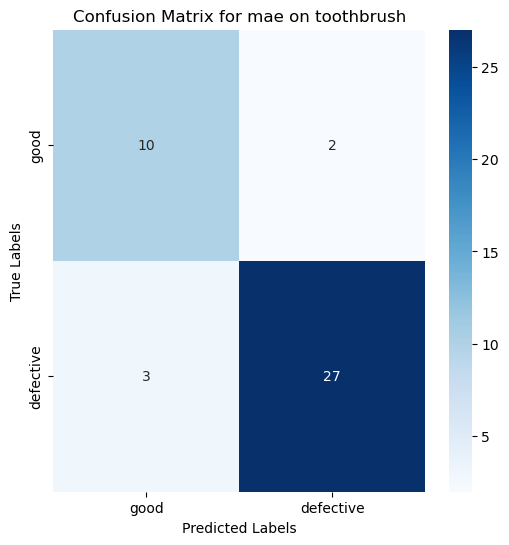

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.955556,0.880952,0.710000,0.216667,0.931034,0.9,0.915254
1,colorization,0.983333,0.928571,0.661111,0.333333,1.000000,0.9,0.947368
2,inpainting,0.950000,0.904762,0.780556,0.333333,0.964286,0.9,0.931034


In [123]:
plot_confusion_matrix(results_90 ,model_name='mae', dataset_name='toothbrush')

df_metrics = get_metrics_dataframe(results_90, "toothbrush")
df_metrics

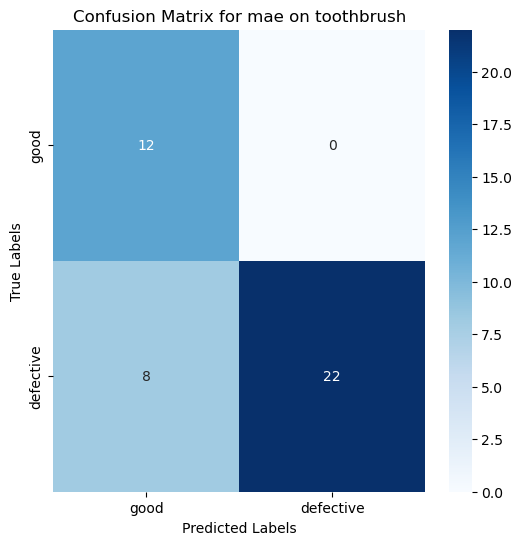

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.947222,0.809524,0.752778,0.277778,1.0,0.733333,0.846154
1,colorization,0.983333,0.880952,0.661111,0.333333,1.0,0.833333,0.909091
2,inpainting,0.930556,0.761905,0.747222,0.333333,1.0,0.666667,0.800000


In [124]:
plot_confusion_matrix(results_90_train ,model_name='mae', dataset_name='toothbrush')

df_metrics = get_metrics_dataframe(results_90_train, "toothbrush")
df_metrics

# 6. Détection d'anomalie par prédiction majoritaire

In [78]:
def majority_voting_metrics_binary(results, dataset_name, datatest, device, beta=1):
    if dataset_name not in results:
        raise ValueError(f"Dataset {dataset_name} n'existe pas dans les résultats.")

    model_results = results[dataset_name]

    y_true = []  # Labels réels
    y_pred_majority = []  # Prédictions finales (majorité)

    with torch.no_grad():
        for image, label in datatest:
            image = image.unsqueeze(0).to(device)  # Ajouter une dimension batch

            # Collecter les prédictions binaires de chaque modèle
            binary_predictions = []

            for model_type, data in model_results.items():
                model = Model[dataset_name][model_type]
                threshold = data["thresholds"]

                # Passer l'image dans le modèle
                output, _ = model(image)

                # Calculer le MSE
                mse_loss = torch.mean((output - image) ** 2).item()

                # Prédiction binaire basée sur le seuil
                binary_predictions.append(1 if mse_loss > threshold else 0)

            # Décision majoritaire
            majority_vote = 1 if sum(binary_predictions) > len(binary_predictions) / 2 else 0
            y_pred_majority.append(majority_vote)

            # Ajouter la vérité terrain (0 pour normal, 1 pour anomalie)
            is_anomaly = 1 if datatest.classes[label] != 'good' else 0
            y_true.append(is_anomaly)

    # Calculer FPR et TPR à partir des réponses binaires
    tp = sum((np.array(y_pred_majority) == 1) & (np.array(y_true) == 1))
    fp = sum((np.array(y_pred_majority) == 1) & (np.array(y_true) == 0))
    tn = sum((np.array(y_pred_majority) == 0) & (np.array(y_true) == 0))
    fn = sum((np.array(y_pred_majority) == 0) & (np.array(y_true) == 1))

    tpr = tp / (tp + fn) if (tp + fn) > 0 else 0  # Taux de vrais positifs
    fpr = fp / (fp + tn) if (fp + tn) > 0 else 0  # Taux de faux positifs

    # Calculer les métriques globales
    global_accuracy = (tp + tn) / (tp + tn + fp + fn)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn)  # Rappel
    f1_score = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall) if (precision + recall) > 0 else 0

    return {
        "fpr": fpr,
        "tpr": tpr,
        "confusion_matrix": {
            "false_positives": fp,
            "true_positives": tp,
            "true_negatives": tn,
            "false_negatives": fn,
        },
        "accuracy": global_accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
    }


In [125]:
def plot_confusion_matrix_combined(confusion_matrix, labels=["Normal", "Anomalie"]):
    # Extraire les valeurs
    fp = confusion_matrix["false_positives"]
    tp = confusion_matrix["true_positives"]
    tn = confusion_matrix["true_negatives"]
    fn = confusion_matrix["false_negatives"]

    # Construire la matrice
    matrix = np.array([[tn, fp],
                       [fn, tp]])

    # Créer un heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    
    # Ajouter des détails
    plt.title("Confusion Matrix", fontsize=16)
    plt.xlabel("Predicted Label", fontsize=14)
    plt.ylabel("True Label", fontsize=14)
    plt.tight_layout()
    plt.show()

In [126]:
def evaluate_majority_voting(results, dataset_name, device):
    # Charger les DataLoaders associés au dataset
    good_loader, anomaly_loader, datatest, train_loader = get_dataloaders(dataset_name)
    
    # Calculer les métriques pour le modèle de décision majoritaire
    majority_metrics = majority_voting_metrics_binary(results, dataset_name, datatest, device)

    # Afficher les métriques calculées
    print(f"Metrics for Majority Voting Model ({dataset_name}):")
    print(f"Accuracy: {majority_metrics['accuracy']:.4f}")
    print(f"Precision: {majority_metrics['precision']:.4f}")
    print(f"Recall: {majority_metrics['recall']:.4f}")
    print(f"F1 Score: {majority_metrics['f1_score']:.4f}")
    
    # Tracer la matrice de confusion
    plot_confusion_matrix_combined(majority_metrics["confusion_matrix"])


## 6.1 AutoVI

Metrics for Majority Voting Model (AutoVI):
Accuracy: 0.6573
Precision: 0.6228
Recall: 0.8975
F1 Score: 0.7354


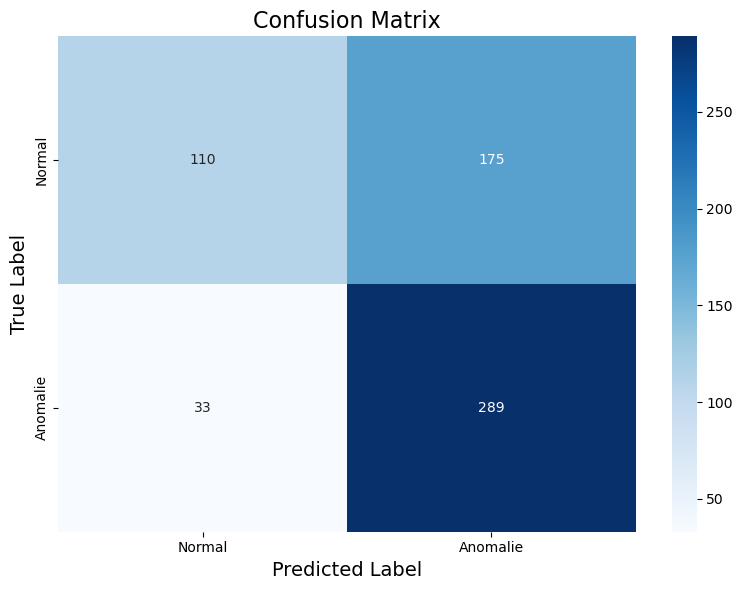

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.749341,0.655684,0.627448,0.345688,0.621505,0.897516,0.734435
1,colorization,0.779547,0.680395,0.673605,0.355430,0.642222,0.897516,0.748705
2,inpainting,0.662450,0.584843,0.581461,0.407229,0.568898,0.897516,0.696386


In [127]:
evaluate_majority_voting(results_90, "AutoVI", device)

df_metrics = get_metrics_dataframe(results_90, "AutoVI")
df_metrics

Metrics for Majority Voting Model (AutoVI):
Accuracy: 0.6573
Precision: 0.6188
Recall: 0.9224
F1 Score: 0.7406


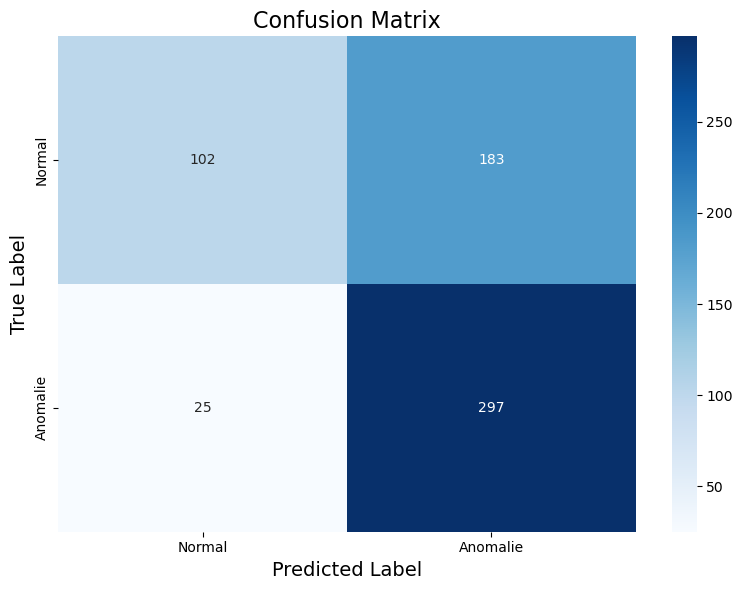

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.749275,0.629325,0.637001,0.352935,0.588665,1.000000,0.741082
1,colorization,0.779547,0.657331,0.673605,0.355430,0.618750,0.922360,0.740648
2,inpainting,0.656761,0.579901,0.580067,0.423639,0.721854,0.338509,0.460888


In [128]:
evaluate_majority_voting(results_90_train, "AutoVI", device)

df_metrics = get_metrics_dataframe(results_90_train, "AutoVI")
df_metrics

## 6.2 Bottle

Metrics for Majority Voting Model (bottle):
Accuracy: 0.8434
Precision: 0.9032
Recall: 0.8889
F1 Score: 0.8960


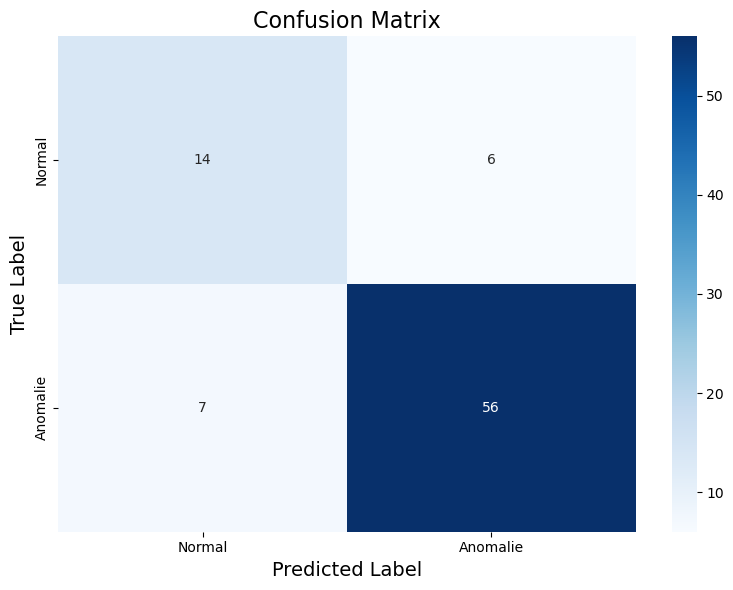

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.922222,0.855422,0.814574,0.368182,0.918033,0.888889,0.903226
1,colorization,0.902381,0.819277,0.819444,0.425000,0.875000,0.888889,0.881890
2,inpainting,0.876984,0.807229,0.783730,0.404167,0.861538,0.888889,0.875000


In [129]:
evaluate_majority_voting(results_90, "bottle", device)

df_metrics = get_metrics_dataframe(results_90, "bottle")
df_metrics

Metrics for Majority Voting Model (bottle):
Accuracy: 0.8193
Precision: 0.9138
Recall: 0.8413
F1 Score: 0.8760


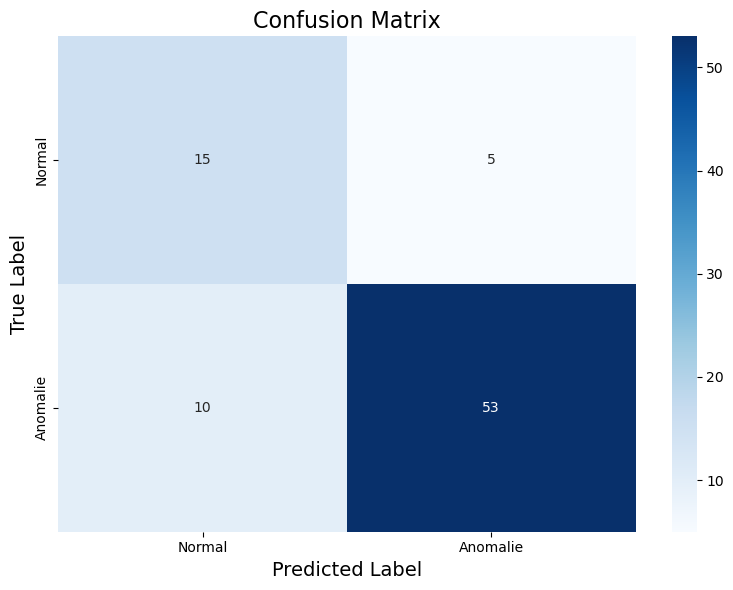

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.915873,0.831325,0.796032,0.370000,0.915254,0.857143,0.885246
1,colorization,0.902381,0.807229,0.819444,0.425000,0.912281,0.825397,0.866667
2,inpainting,0.870635,0.759036,0.772283,0.380769,0.905660,0.761905,0.827586


In [130]:
evaluate_majority_voting(results_90_train, "bottle", device)

df_metrics = get_metrics_dataframe(results_90_train, "bottle")
df_metrics

## 6.3 Capsule

Metrics for Majority Voting Model (capsule):
Accuracy: 0.7879
Precision: 0.8462
Recall: 0.9083
F1 Score: 0.8761


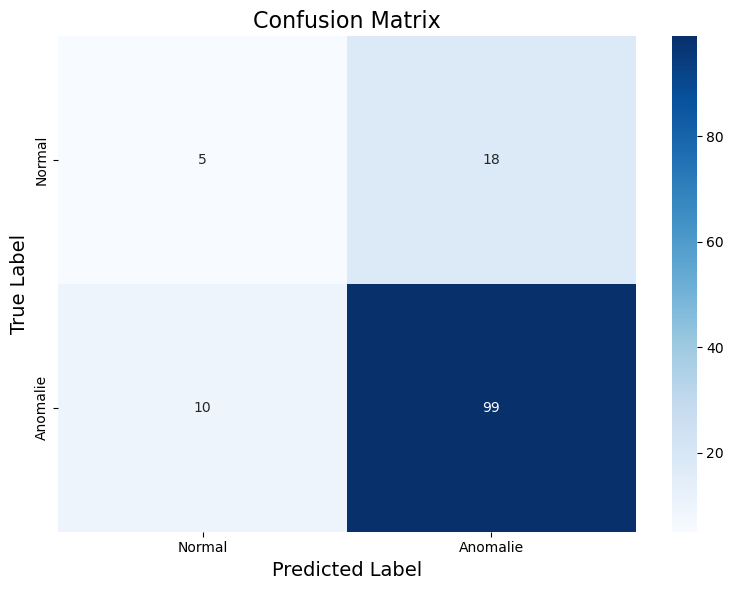

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.629836,0.780303,0.586113,0.463439,0.844828,0.899083,0.871111
1,colorization,0.583566,0.780303,0.576889,0.493789,0.844828,0.899083,0.871111
2,inpainting,0.624252,0.780303,0.568589,0.454451,0.844828,0.899083,0.871111


In [131]:
evaluate_majority_voting(results_90, "capsule", device)

df_metrics = get_metrics_dataframe(results_90, "capsule")
df_metrics

Metrics for Majority Voting Model (capsule):
Accuracy: 0.3788
Precision: 0.9091
Recall: 0.2752
F1 Score: 0.4225


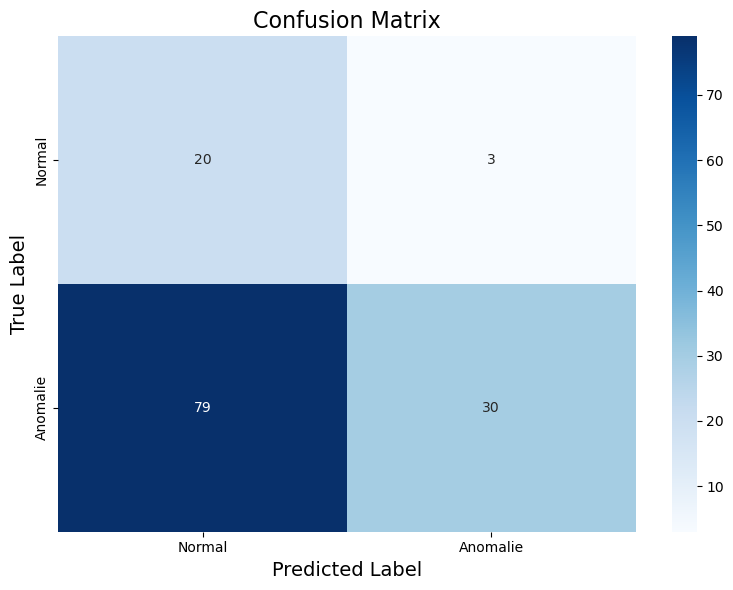

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.626247,0.386364,0.625127,0.506039,0.888889,0.293578,0.441379
1,colorization,0.583566,0.356061,0.576889,0.493789,0.900000,0.247706,0.388489
2,inpainting,0.572796,0.340909,0.527040,0.463387,0.843750,0.247706,0.382979


In [132]:
evaluate_majority_voting(results_90_train, "capsule", device)

df_metrics = get_metrics_dataframe(results_90_train, "capsule")
df_metrics

## 6.4 Hazelnut

Metrics for Majority Voting Model (capsule):
Accuracy: 0.7955
Precision: 0.8475
Recall: 0.9174
F1 Score: 0.8811


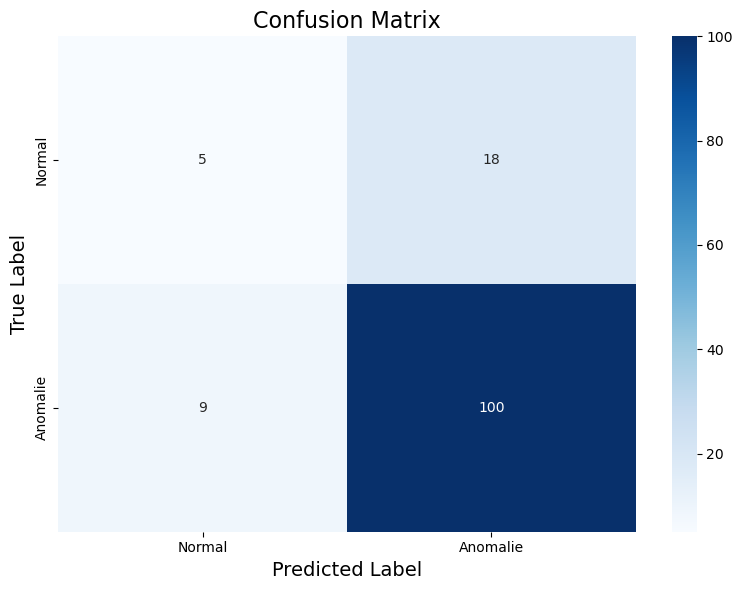

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.629836,0.780303,0.586113,0.463439,0.844828,0.899083,0.871111
1,colorization,0.583566,0.780303,0.576889,0.493789,0.844828,0.899083,0.871111
2,inpainting,0.624252,0.780303,0.568589,0.454451,0.844828,0.899083,0.871111


In [133]:
evaluate_majority_voting(results_90, "capsule", device)

df_metrics = get_metrics_dataframe(results_90, "capsule")
df_metrics

Metrics for Majority Voting Model (hazelnut):
Accuracy: 0.7273
Precision: 1.0000
Recall: 0.5714
F1 Score: 0.7273


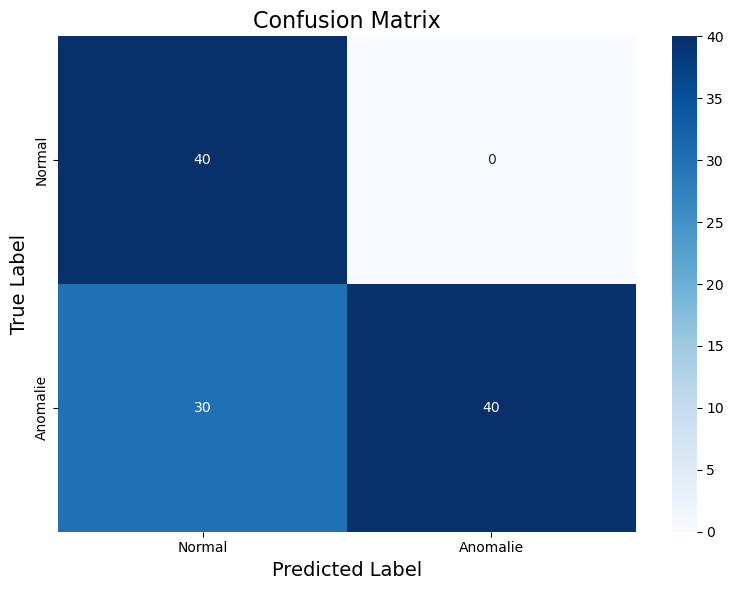

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.909643,0.736364,0.803125,0.320312,1.0,0.585714,0.738739
1,colorization,0.896071,0.718182,0.786161,0.339062,1.0,0.557143,0.715596
2,inpainting,0.888929,0.727273,0.804286,0.391667,1.0,0.571429,0.727273


In [134]:
evaluate_majority_voting(results_90_train, "hazelnut", device)

df_metrics = get_metrics_dataframe(results_90_train, "hazelnut")
df_metrics

## 6.5 Toothbrush

Metrics for Majority Voting Model (toothbrush):
Accuracy: 0.9048
Precision: 0.9643
Recall: 0.9000
F1 Score: 0.9310


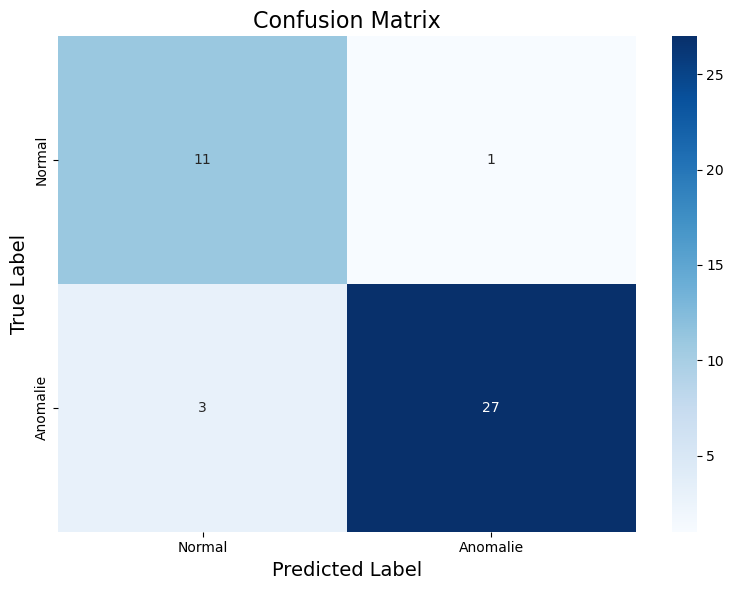

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.955556,0.880952,0.710000,0.216667,0.931034,0.9,0.915254
1,colorization,0.983333,0.928571,0.661111,0.333333,1.000000,0.9,0.947368
2,inpainting,0.950000,0.904762,0.780556,0.333333,0.964286,0.9,0.931034


In [135]:
evaluate_majority_voting(results_90, "toothbrush", device)

df_metrics = get_metrics_dataframe(results_90, "toothbrush")
df_metrics

Metrics for Majority Voting Model (toothbrush):
Accuracy: 0.8095
Precision: 1.0000
Recall: 0.7333
F1 Score: 0.8462


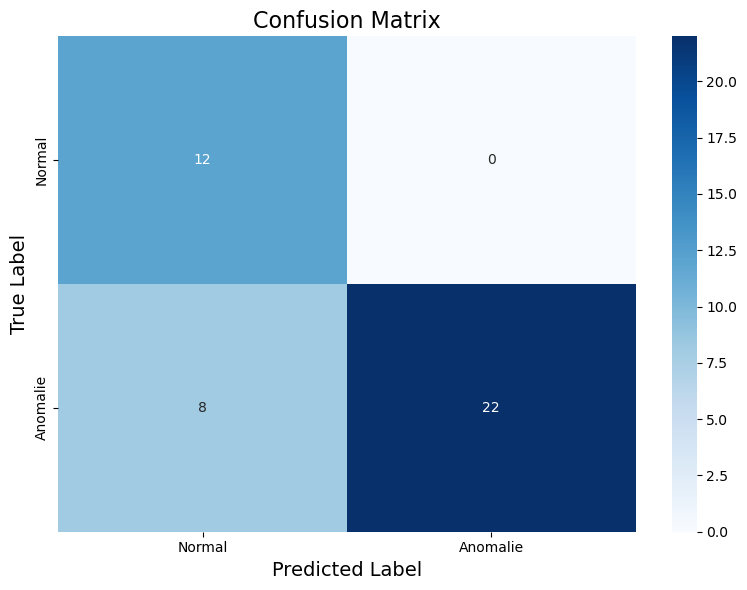

,Model,AUROC,Accuracy,TPR (mean),FPR (mean),Precision,Recall,F1 Score
0,mae,0.947222,0.809524,0.752778,0.277778,1.0,0.733333,0.846154
1,colorization,0.983333,0.880952,0.661111,0.333333,1.0,0.833333,0.909091
2,inpainting,0.930556,0.761905,0.747222,0.333333,1.0,0.666667,0.800000


In [136]:
evaluate_majority_voting(results_90_train, "toothbrush", device)

df_metrics = get_metrics_dataframe(results_90_train, "toothbrush")
df_metrics